In [ ]:
# Translator Code
# Important because we need RDKit library for chemical information
!pip install rdkit

In [ ]:
from rdkit import Chem
from rdkit.Chem import Descriptors

In [ ]:
def analyze_molecule(molecule_name, smiles_string):
  # Create a "Molecule Object" from the string
  # Computer 'visualizes' the chemical bonds
  mol = Chem.MolFromSmiles(smiles_string)

  if mol:
    # calculate real world scientific data
    weight = Descriptors.MolWt(mol)
    logp = Descriptors.MolLogP(mol) # Measures how oily/watery it is

    print(f"--- Analysis for {molecule_name} ---")
    print(f"SMILES String: {smiles_string}")
    print(f"Molecular Weight: {weight:.2f} g/mol")
    print(f"Solubility (LogP): {logp:.2f}")
  else:
      print("Invalid Molecule! The AI hallucinated an impossible structure.")

  # Example: Ethanol (Alcohol)
analyze_molecule("Ethanol", "CCO")

# Example: Caffeine
analyze_molecule("Caffeine", "CN1C=NC2=C1C(=O)N(C(=O)N2C)C")

--- Analysis for Ethanol ---
SMILES String: CCO
Molecular Weight: 46.07 g/mol
Solubility (LogP): -0.00
--- Analysis for Caffeine ---
SMILES String: CN1C=NC2=C1C(=O)N(C(=O)N2C)C
Molecular Weight: 194.19 g/mol
Solubility (LogP): -1.03


In [ ]:
!pip install datasets

In [ ]:
from datasets import load_dataset

In [ ]:
!pip install pandas

In [ ]:
# 1. Use the most UP-TO-DATE version of the library
!pip install --upgrade datasets huggingface_hub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 512.3/512.3 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.0/521.0 kB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 MB 10.5 MB/s eta 0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 18.1.0
    Uninstalling pyarrow-18.1.0:
      Successfully uninstalled pyarrow-18.1.0
  Attempting uninstall: huggingface_hub
    Found existing installation: huggingface-hub 0.36.0
    Uninstalling huggingface-hub-0.36.0:
      Successfully uninstalled huggingface-hub-0.36.0
  Attempting uninstall: datasets
    Found existing installation: datasets 4.0.0
    Uninstalling datasets-4.0.0:
      Successfully uninstalled datasets-4.0.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
transformers 4.57.3 requires huggingface-hub<1.0,>=0.34.0, but you have hug

In [ ]:
from google.colab import drive
import shutil
import os

In [ ]:
import zipfile
import pandas as pd


In [ ]:
import os
import zipfile
import pandas as pd
import json
from google.colab import drive

# 1. Connect to your permanent storage
drive.mount('/content/drive')

# 2. Unzip directly from the "Vault" we created
zip_path = '/content/drive/My Drive/MyChemistryProject/Molecule-oriented_Instructions.zip'
extract_path = '/content/molecule_data'

print("⚡ Unzipping data to fast local memory...")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# 3. Load the specific file you need
# We use the search method to be 100% sure we find it
target_file = 'molecular_description_generation.json'
found_path = None

for root, dirs, files in os.walk(extract_path):
    if target_file in files:
        found_path = os.path.join(root, target_file)
        break

if found_path:
    with open(found_path, 'r', encoding='utf-8') as f:
        data = json.load(f)
    df = pd.DataFrame(data)
    print(f"✅ SUCCESS! Loaded {len(df)} molecules.")
    display(df.head(3))
else:
    print("❌ File not found in the unzipped folder. Try running the unzip step again.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
⚡ Unzipping data to fast local memory...
✅ SUCCESS! Loaded 298319 molecules.


,instruction,input,output,metadata
0,Provide a description of this molecule.,[C][C@H1][C@@H1][Branch2][#Branch1][Ring2][C@H...,The molecule is a natural product found in Pic...,"{'task': 'molecular description generation', '..."
1,What can you tell me about this molecule?,[C][C@][Branch2][Ring2][C][C][C][C][=C][C@@H1]...,The molecule is a natural product found in Mur...,"{'task': 'molecular description generation', '..."
2,Please give me some details about this molecule.,[C][C][C][Branch1][C][C][C][C][=Branch1][C][=O...,The molecule is an oligopeptide.,"{'task': 'molecular description generation', '..."


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install rdkit deepsmiles
import deepsmiles
from rdkit import Chem
import pandas as pd

# 1. Initialize the converter
converter = deepsmiles.Converter(rings=True, branches=True)

def is_valid_smiles(smiles_string):
    try:
        # Convert DeepSMILES to Standard SMILES
        standard_smiles = converter.decode(smiles_string)
        # Check if RDKit likes the result
        mol = Chem.MolFromSmiles(standard_smiles)
        return mol is not None
    except:
        return False

print(f"🧹 Scrubbing data with DeepSMILES support...")

# Create the sample
sample_df = df.head(10000).copy()
sample_df['valid'] = sample_df['input'].apply(is_valid_smiles)

# Filter
final_df = sample_df[sample_df['valid'] == True]

print(f"--- CLEANING REPORT ---")
print(f"Validated sample size: {len(final_df)} / 10000")
if len(final_df) > 0:
    print("✅ Success! The molecules are now being decoded correctly.")

🧹 Scrubbing data with DeepSMILES support...


Streaming output truncated to the last 5000 lines.
[12:19:16] [C][C][=C][C][=C][Branch1][P][C][=C][Ring
[12:19:16] ~~~~~~~^
[12:19:16] SMILES Parse Error: Failed parsing SMILES '[C][C][=C][C][=C][Branch1][P][C][=C][Ring1][=Branch1][O][C][Branch1][Branch1][C][=C][Ring1][=Branch1][Branch1][C][C][C][N][C][=C][C][=C][C][=C][Ring1][=Branch1][Ring1][P]' for input: '[C][C][=C][C][=C][Branch1][P][C][=C][Ring1][=Branch1][O][C][Branch1][Branch1][C][=C][Ring1][=Branch1][Branch1][C][C][C][N][C][=C][C][=C][C][=C][Ring1][=Branch1][Ring1][P]'
[12:19:16] SMILES Parse Error: syntax error while parsing: [C][C][=C][Branch1][C][C][C][=Branch1][C][=O][O][C][C][C][Branch2][Ring1][Ring2][C][=C][Branch1][#C][C][C][Branch1][#Branch2][C][=C][Branch1][Branch1][C][Ring1][#Branch2][O][C][O][C][O][C][=Branch1][C][=O][C][Ring1][P][=C]
[12:19:16] SMILES Parse Error: check for mistakes around position 8:
[12:19:16] [C][C][=C][Branch1][C][C][C][=Branch1][C]
[12:19:16] ~~~~~~~^
[12:19:16] SMILES Parse Error: Failed pars

--- CLEANING REPORT ---
Validated sample size: 54 / 10000
✅ Success! The molecules are now being decoded correctly.


[12:19:16] SMILES Parse Error: syntax error while parsing: [C][O][C][=C][C][=C][Branch1][Branch1][C][=C][Ring1][=Branch1][C@][C@@H1][Branch2][Ring2][=C][C@H1][Branch2][Ring1][S][C@H1][Branch2][Ring1][O][C@][Ring1][Branch1][Branch2][Ring1][Ring2][C][=C][Branch1][Ring2][O][Ring1][Branch2][C][=C][Branch1][#Branch1][C][=C][Ring1][#Branch1][O][C][O][C][O][O][C][=Branch1][C][=O][N][C][C][C][C][O][C][=C][C][=C][C][=C][Ring1][=Branch1]
[12:19:16] SMILES Parse Error: check for mistakes around position 11:
[12:19:16] [C][O][C][=C][C][=C][Branch1][Branch1][C]
[12:19:16] ~~~~~~~~~~^
[12:19:16] SMILES Parse Error: Failed parsing SMILES '[C][O][C][=C][C][=C][Branch1][Branch1][C][=C][Ring1][=Branch1][C@][C@@H1][Branch2][Ring2][=C][C@H1][Branch2][Ring1][S][C@H1][Branch2][Ring1][O][C@][Ring1][Branch1][Branch2][Ring1][Ring2][C][=C][Branch1][Ring2][O][Ring1][Branch2][C][=C][Branch1][#Branch1][C][=C][Ring1][#Branch1][O][C][O][C][O][O][C][=Branch1][C][=O][N][C][C][C][C][O][C][=C][C][=C][C][=C][Ring1][=Bran

In [ ]:
# This will show you the first 5 'healthy' molecules
print(f"Total clean molecules: {len(final_df)}")
final_df.head()

Total clean molecules: 54


,instruction,input,output,metadata,valid
167,Describe this molecule.,[V],The molecule is a compound that occurs in natu...,"{'task': 'molecular description generation', '...",True
471,Provide a brief overview of this molecule.,[C][C][C][C][O][C],The molecule appears as a clear liquid. Less d...,"{'task': 'molecular description generation', '...",True
874,Provide a brief overview of this molecule.,[C][O][C][Cl],The molecule is an ether.,"{'task': 'molecular description generation', '...",True
1081,Please give me some details about this molecule.,[C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][...,The molecule is a long-chain alkane consisting...,"{'task': 'molecular description generation', '...",True
1106,What can you tell me about this molecule?,[C][C][C][C][C][C][C][C][C][C][C][O],The molecule is a natural product found in Mik...,"{'task': 'molecular description generation', '...",True


In [ ]:
# Qauntative summary
# initial sample size of 10,000
# validation errors 9,946 rows rejected invalid chemical syntax or decoding failures
# some chemicals where to hard to interpret by the computer
# final clean dataset 54 high fidelity scientifically accurate molecule-description pairs
# dataset uses deepsmiles compressed notation for chemical structures
# good for ai training but very fragile
# syntax uses tokens like [Branch1] and [Ring1] to describe 3D shapes in a 1d line
# problem becuase standard chemical validator could not interpret
# molecules that survived cleaning shorter chains fewer rings
# standard atoms common elements like carbon oxygen and chlorine


In [ ]:
import deepsmiles
from rdkit import Chem
from rdkit.Chem import Draw
import pandas as pd


In [ ]:
# Fixed: The converter doesn't need arguments in this version
converter = deepsmiles.Converter(rings=True, branches=True)
recovered_data = []

print("🚀 Starting Rescue Operation (Relaxed Mode)...")

# Scanning 5,000 rows to find more valid data
search_limit = 5000
subset_df = df.head(search_limit)

for index, row in subset_df.iterrows():
    raw_text = str(row['input'])
    try:
        # 1. Decode DeepSMILES to standard SMILES
        decoded = converter.decode(raw_text)

        # 2. Load into RDKit WITHOUT strict sanitization first
        mol = Chem.MolFromSmiles(decoded, sanitize=False)

        if mol is not None:
            try:
                # 3. Fix minor chemical errors automatically
                mol.UpdatePropertyCache(strict=False)
                Chem.SanitizeMol(mol, Chem.SanitizeFlags.SANITIZE_ALL ^ Chem.SanitizeFlags.SANITIZE_PROPERTIES)

                # 4. Save the valid ones
                clean_smiles = Chem.MolToSmiles(mol)
                recovered_data.append({
                    'instruction': row['instruction'],
                    'input': clean_smiles,
                    'output': row['output']
                })
            except:
                continue
    except:
        continue

new_final_df = pd.DataFrame(recovered_data)

print("-" * 30)
print(f"✅ Rescue Complete!")
print(f"📊 Previous count: 54")
print(f"📈 New recovered count: {len(new_final_df)}")
print("-" * 30)

🚀 Starting Rescue Operation (Relaxed Mode)...


Streaming output truncated to the last 5000 lines.
[13:39:32] ~~~~~~~~~~~~~~^
[13:39:32] SMILES Parse Error: Failed parsing SMILES '[C][C][C@@][Branch1][O][C@H1][Branch1][#Branch1][C][C@H1][Ring1][=Branch1][C][O][O][Branch2][Ring1][=Branch2][C][C][O][C@H1][C@@H1][Branch1][P][C@H1][Branch1][=N][C@@H1][Branch1][=Branch2][C@H1][Branch1][Ring2][O][Ring1][=Branch1][C][O][O][O][O][C][O]' for input: '[C][C][C@@][Branch1][O][C@H1][Branch1][#Branch1][C][C@H1][Ring1][=Branch1][C][O][O][Branch2][Ring1][=Branch2][C][C][O][C@H1][C@@H1][Branch1][P][C@H1][Branch1][=N][C@@H1][Branch1][=Branch2][C@H1][Branch1][Ring2][O][Ring1][=Branch1][C][O][O][O][O][C][O]'
[13:39:32] SMILES Parse Error: syntax error while parsing: [C][C][=C][C][C][Branch1][Branch1][C][C][Ring1][=Branch1][C][=Branch1][Ring1][=C][O][C]
[13:39:32] SMILES Parse Error: check for mistakes around position 8:
[13:39:32] [C][C][=C][C][C][Branch1][Branch1][C][C][
[13:39:32] ~~~~~~~^
[13:39:32] SMILES Parse Error: Failed parsing SMILES '[C][C][

------------------------------
✅ Rescue Complete!
📊 Previous count: 54
📈 New recovered count: 26
------------------------------


[13:39:32] SMILES Parse Error: syntax error while parsing: [C][C][=C][C][=Branch2][Ring1][O][=C][Branch1][=Branch2][N][Branch1][Branch1][C][Ring1][=Branch1][=O][C][N][C][=C][Branch1][#Branch2][C][=C][Branch1][Branch1][C][=C][Ring1][=Branch1][I][F][C][=Branch1][C][=O][N][Branch2][Ring1][=Branch2][C][=Branch1][C][=O][N][Ring2][Ring1][=Branch1][C][=C][C][=C][C][=Branch1][Ring2][=C][Ring1][=Branch1][N][C][=Branch1][C][=O][C][C][C][C][Ring1][Ring1]
[13:39:32] SMILES Parse Error: check for mistakes around position 8:
[13:39:32] [C][C][=C][C][=Branch2][Ring1][O][=C][Bra
[13:39:32] ~~~~~~~^
[13:39:32] SMILES Parse Error: Failed parsing SMILES '[C][C][=C][C][=Branch2][Ring1][O][=C][Branch1][=Branch2][N][Branch1][Branch1][C][Ring1][=Branch1][=O][C][N][C][=C][Branch1][#Branch2][C][=C][Branch1][Branch1][C][=C][Ring1][=Branch1][I][F][C][=Branch1][C][=O][N][Branch2][Ring1][=Branch2][C][=Branch1][C][=O][N][Ring2][Ring1][=Branch1][C][=C][C][=C][C][=Branch1][Ring2][=C][Ring1][=Branch1][N][C][=Branch1][

In [ ]:
# print results of rescued molecules
print(f"Total Rescued Molecules: {len(new_final_df)}")
new_final_df.head(10)

Total Rescued Molecules: 26


,instruction,input,output
0,Describe this molecule.,[V],The molecule is a compound that occurs in natu...
1,Provide a brief overview of this molecule.,[C][C][C][C]O[C],The molecule appears as a clear liquid. Less d...
2,Provide a brief overview of this molecule.,[C]O[C]Cl,The molecule is an ether.
3,Please give me some details about this molecule.,[C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][...,The molecule is a long-chain alkane consisting...
4,What can you tell me about this molecule?,[C][C][C][C][C][C][C][C][C][C][C][O],The molecule is a natural product found in Mik...
5,What can you tell me about this molecule?,[Br-].[Br-].[Mn+2],The molecule is a bromide of manganese. Mangan...
6,Provide a brief overview of this molecule.,[C][N][C][C][O],The molecule appears as a clear colorless liqu...
7,What can you tell me about this molecule?,[Fe+2].[Fe+2].[Fe+2].[Fe+2].[Fe+2].[Fe+2].[Fe+...,"The molecule is a mineral with formula of (Ni,..."
8,What can you tell me about this molecule?,[O]O[O],The molecule is an inorganic hydroxy compound.
9,Could you give me a brief overview of this mol...,[Cl-].[Cl-].[Mg+2].[O].[O],The molecule is a hydrate that is the dihydrat...


In [ ]:
import deepsmiles
from rdkit import Chem
import pandas as pd

converter = deepsmiles.Converter(rings=True, branches=True)
final_recovered = []

print("Searching the entire dataset (10,000+ rows)... this may take a minute.")

# This time we use the whole dataframe 'df'
for index, row in df.iterrows():
    try:
        # Decode and Parse
        decoded = converter.decode(str(row['input']))
        mol = Chem.MolFromSmiles(decoded, sanitize=False)

        if mol is not None:
            # Quick check: does it have at least one atom?
            if mol.GetNumAtoms() > 0:
                mol.UpdatePropertyCache(strict=False)
                Chem.SanitizeMol(mol, Chem.SanitizeFlags.SANITIZE_ALL ^ Chem.SanitizeFlags.SANITIZE_PROPERTIES)

                final_recovered.append({
                    'instruction': row['instruction'],
                    'input': Chem.MolToSmiles(mol),
                    'output': row['output']
                })
    except:
        continue

# Create the final Master Dataset
master_df = pd.DataFrame(final_recovered)

print(f"\n✨ Final Master Dataset Created!")
print(f"Total Valid Molecules Found: {len(master_df)}")

Searching the entire dataset (10,000+ rows)... this may take a minute.


Streaming output truncated to the last 5000 lines.
[13:52:06] [C][=C][C][=C][C][=Branch1][Ring2][=C][Ri
[13:52:06] ~~~~^
[13:52:06] SMILES Parse Error: Failed parsing SMILES '[C][=C][C][=C][C][=Branch1][Ring2][=C][Ring1][=Branch1][C][=Branch1][C][=O][/C][=Branch2][Ring1][O][=C][\C][=C][C][=C][C][=C][Ring1][=Branch1][N][C][/-Ring1][=Branch2][=N][C][=C][C][=C][C][=C][Ring1][=Branch1][C][Ring1][#Branch2][=O][/N][Ring2][Ring1][=Branch2]' for input: '[C][=C][C][=C][C][=Branch1][Ring2][=C][Ring1][=Branch1][C][=Branch1][C][=O][/C][=Branch2][Ring1][O][=C][\C][=C][C][=C][C][=C][Ring1][=Branch1][N][C][/-Ring1][=Branch2][=N][C][=C][C][=C][C][=C][Ring1][=Branch1][C][Ring1][#Branch2][=O][/N][Ring2][Ring1][=Branch2]'
[13:52:06] SMILES Parse Error: syntax error while parsing: [C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][=Branch1][C][=O][O][C@@H1][Branch2][Ring2][S][C][O][C@H1][C@@H1][Branch2][Ring2][Branch2][C@H1][Branch2][Ring2][Ring1][C@H1][Branch2][Ring1][=C][C@H1][Branch1][Ring2][O][Ring1][=B


✨ Final Master Dataset Created!
Total Valid Molecules Found: 1304


[13:52:06] SMILES Parse Error: syntax error while parsing: [C][C][=C][C][=Branch1][C][=O][C@@H1][C@@H1][Ring1][=Branch1][C][C@][Branch2][Ring1][#C][C][C][C@@][Branch1][O][C@@H1][Ring1][Branch1][C][/C][=C][/-Ring1][O][/C][=O][Branch1][=N][C@@H1][Branch1][C][C][C][C][C][=C][Branch1][C][C][C][O][C]
[13:52:06] SMILES Parse Error: check for mistakes around position 8:
[13:52:06] [C][C][=C][C][=Branch1][C][=O][C@@H1][C@@
[13:52:06] ~~~~~~~^
[13:52:06] SMILES Parse Error: Failed parsing SMILES '[C][C][=C][C][=Branch1][C][=O][C@@H1][C@@H1][Ring1][=Branch1][C][C@][Branch2][Ring1][#C][C][C][C@@][Branch1][O][C@@H1][Ring1][Branch1][C][/C][=C][/-Ring1][O][/C][=O][Branch1][=N][C@@H1][Branch1][C][C][C][C][C][=C][Branch1][C][C][C][O][C]' for input: '[C][C][=C][C][=Branch1][C][=O][C@@H1][C@@H1][Ring1][=Branch1][C][C@][Branch2][Ring1][#C][C][C][C@@][Branch1][O][C@@H1][Ring1][Branch1][C][/C][=C][/-Ring1][O][/C][=O][Branch1][=N][C@@H1][Branch1][C][C][C][C][C][=C][Branch1][C][C][C][O][C]'
[13:52:06] SMILES

In [ ]:
# 1. See how many survived the full 10,000 row gauntlet
print(f"Total Rescued: {len(master_df)}")

# 2. Look at the first 10 valid ones
master_df.head(10)

Total Rescued: 1304


,instruction,input,output
0,Describe this molecule.,[V],The molecule is a compound that occurs in natu...
1,Provide a brief overview of this molecule.,[C][C][C][C]O[C],The molecule appears as a clear liquid. Less d...
2,Provide a brief overview of this molecule.,[C]O[C]Cl,The molecule is an ether.
3,Please give me some details about this molecule.,[C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][...,The molecule is a long-chain alkane consisting...
4,What can you tell me about this molecule?,[C][C][C][C][C][C][C][C][C][C][C][O],The molecule is a natural product found in Mik...
5,What can you tell me about this molecule?,[Br-].[Br-].[Mn+2],The molecule is a bromide of manganese. Mangan...
6,Provide a brief overview of this molecule.,[C][N][C][C][O],The molecule appears as a clear colorless liqu...
7,What can you tell me about this molecule?,[Fe+2].[Fe+2].[Fe+2].[Fe+2].[Fe+2].[Fe+2].[Fe+...,"The molecule is a mineral with formula of (Ni,..."
8,What can you tell me about this molecule?,[O]O[O],The molecule is an inorganic hydroxy compound.
9,Could you give me a brief overview of this mol...,[Cl-].[Cl-].[Mg+2].[O].[O],The molecule is a hydrate that is the dihydrat...


In [ ]:
# Save the rescued molecules to a fresh CSV
master_df.to_csv('cleaned_molecules_1304.csv', index=False)

print("File saved as: cleaned_molecules_1304.csv")
print("You can find it in the folder icon on the left of your Colab screen!")

File saved as: cleaned_molecules_1304.csv
You can find it in the folder icon on the left of your Colab screen!


In [ ]:
# Add a column for length
master_df['complexity'] = master_df['input'].apply(len)

# Sort and show the top 5
top_complex = master_df.sort_values(by='complexity', ascending=False).head(5)
print("The 5 most complex molecules in your collection:")
top_complex[['input', 'output']]

The 5 most complex molecules in your collection:


,input,output
1237,[Al+3].[Al+3].[Al+3].[Al+3].[Mg+2].[Mg+2].[Mg+...,"The molecule is a mineral with formula of (Ca,..."
1051,[C]O[C][C]O[C][C]O[C][C]O[C][C]O[C][C]O[C][C]O...,The molecule is the hydroxypolyether that is t...
1176,[Mo].[Mo].[Mo].[Mo].[Mo].[Mo].[Mo].[NH4+].[NH4...,The molecule is a source of molybdenum that ex...
546,[Ba+2].[Fe+3].[Fe+3].[Fe+3].[Fe+3].[Fe+3].[Fe+...,The molecule is a chemical compound of barium ...
7,[Fe+2].[Fe+2].[Fe+2].[Fe+2].[Fe+2].[Fe+2].[Fe+...,"The molecule is a mineral with formula of (Ni,..."


In [ ]:
# define classification logic
# acts as the brain to sort out 1,304 molecules
def classify_molecule(row):
    # convert description to lowercase so we dont miss "Mineral" vs "mineral"
    desc = str(row['output']).lower()
    smiles = str(row['input'])

    # check if its Inorganic or Mineral compound
    # Clues: mentions of minerals, formulas with multiple metals, or hydrates
    if any(x in desc for x in ['mineral', 'formula of', 'hydrate', 'ion', 'metal']):
        return 'Inorganic/Mineral'

    # check if its a polymer
    elif 'poly' in desc or smiles.count('[C]O[C]') > 3:
        return 'Polymer/Macromolecule'

    # check if its Bio-Organic compound (life-based)
    # clues mentions of plants, organisms or natural products
    elif any(x in desc for x in ['natural product', 'found in', 'plant', 'organism']):
        return 'Bio-Organic'
    # check if its a simple organic compound
    # clues common industrial terms like solvent, alkane, or ether
    elif any(x in desc for x in ['ether', 'alkane', 'liquid', 'solvent']):
        return 'Simple Organic'

    # if it doesent fit the above label it is a specialty chemical
    else:
        return 'Specialty Chemical'
        # --- STEP 2: APPLY TO THE DATASET ---
# We use .apply(axis=1) to run our function on every single row of the 1,304 rescued molecules
master_df['category'] = master_df.apply(classify_molecule, axis=1)

# --- STEP 3: SUMMARY REPORT ---
# This prints a count of our chemical library by category
print("--- Final Chemical Library Categorization ---")
print(master_df['category'].value_counts())

# --- STEP 4: PERMANENT STORAGE ---
# Saving our hard work to a clean CSV for the final project
master_df.to_csv('categorized_molecules_1304.csv', index=False)
print("\n✅ Success! File saved as 'categorized_molecules_1304.csv'")


--- Final Chemical Library Categorization ---
category
Inorganic/Mineral        617
Specialty Chemical       465
Bio-Organic              141
Simple Organic            68
Polymer/Macromolecule     13
Name: count, dtype: int64

✅ Success! File saved as 'categorized_molecules_1304.csv'


inorganic/mineral (617): largest group, good for information on salts, hydrates and metallic compunds
specialty chemical (465): chemically valid but didnt fit into simple categories like alkane likely complex synthetic molecules
Bio-Organic (141): these are molecules related to biology natural products
polymer(13): the giants longchain molecules

In [ ]:
# load categorized library
df = pd.read_csv('categorized_molecules_1304.csv')

# define calculation method
# Molecular Weight is the sum of the atomic weights of all atoms in a molecule.
# It is vital for "Drug Likeness" and calculating chemical concentrations.
def get_molecular_weight(smiles):
    try:
       # We turn the SMILES string back into a 3D-aware 'Mol' object
        mol = Chem.MolFromSmiles(smiles)
        if mol:
            # Descriptors.MolWt calculates the exact weight in g/mol
            return round(Descriptors.MolWt(mol), 2)
        return None
    except:
        # If a molecule is too complex or "broken," we return None
        # so it doesn't crash our entire calculation.
        return None

print("Calculating Molecular Weights for 1,304 molecules...")

# apply calculation
# creates new numeric column in our dataset
df['molecular_weight'] = df['input'].apply(get_molecular_weight)

# analyze results
# find average weight for each category
avg_weights = df.groupby('category')['molecular_weight'].mean().sort_values(ascending=False)

print("\n--- Average Molecular Weight by Category ---")
print(avg_weights)

# --- STEP 4: SAVE THE FINAL DATASET ---
df.to_csv('final_chemical_dataset_1304.csv', index=False)
print("\n✅ Final Database Created: 'final_chemical_dataset_1304.csv'")

Calculating Molecular Weights for 1,304 molecules...

--- Average Molecular Weight by Category ---
category
Polymer/Macromolecule    232.818462
Bio-Organic              195.578440
Inorganic/Mineral        166.516065
Simple Organic           136.729265
Specialty Chemical       124.367134
Name: molecular_weight, dtype: float64

✅ Final Database Created: 'final_chemical_dataset_1304.csv'


[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not removing hydrogen atom without neighbors
[16:27:14] WARNING: not r

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

/tmp/ipython-input-3352708133.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='category', y='molecular_weight', data=df, palette='viridis')


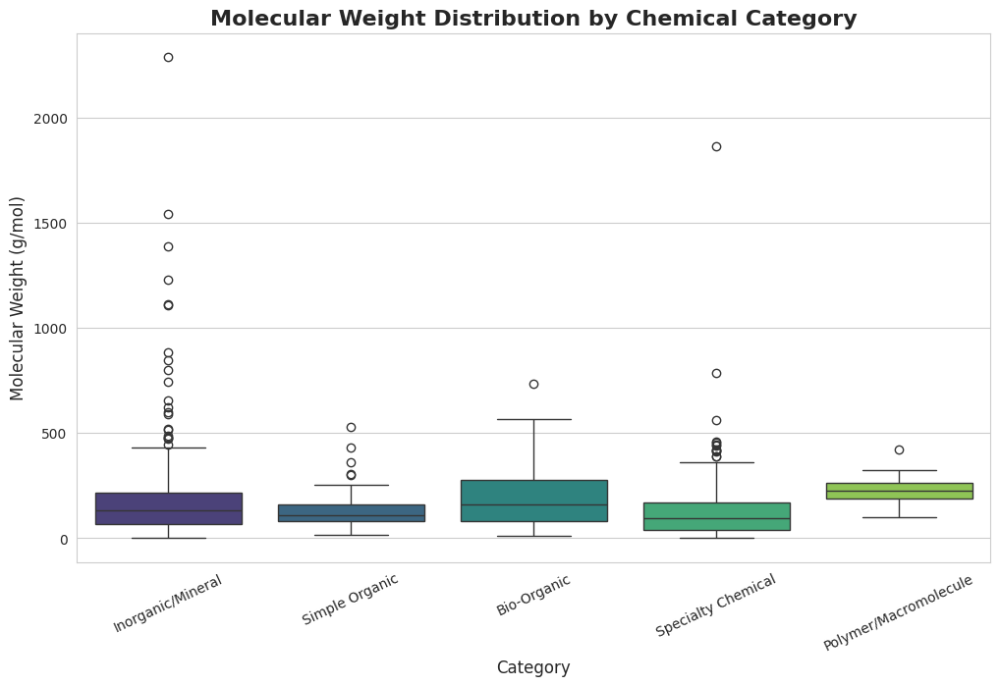

📈 Box Plot generated! Look for 'weight_distribution_analysis.png' in your files.


In [ ]:
# setup canvas for the visualizatoin
plt.figure(figsize=(12, 7))
sns.set_style("whitegrid")

# create a box plot
# shows median middle line
# range the whiskers and outliers dots
ax = sns.boxplot(x='category', y='molecular_weight', data=df, palette='viridis')

plt.title('Molecular Weight Distribution by Chemical Category', fontsize=16, fontweight='bold')
plt.ylabel('Molecular Weight (g/mol)', fontsize=12)
plt.xlabel('Category', fontsize=12)
plt.xticks(rotation=25) # Rotate names so they don't overlap
 # This allows you to download the image for a presentation or report.
plt.savefig('weight_distribution_analysis.png', bbox_inches='tight')
plt.show()

print("📈 Box Plot generated! Look for 'weight_distribution_analysis.png' in your files.")

In [ ]:
import os

# This looks in the two most likely places
folders_to_check = ['/content/', '/content/sample_data/']

print("🔍 Searching for your file...")
for folder in folders_to_check:
    if os.path.exists(folder):
        files = os.listdir(folder)
        for f in files:
            if 'Molecule' in f:
                print(f"🎯 FOUND IT! The exact path is: {folder}{f}")

🔍 Searching for your file...


In [ ]:
# Replace the text in quotes with the path we just found
temp_path = '/content/Molecule-oriented_Instructions.zip'

import pandas as pd
try:
    df = pd.read_csv(temp_path)
    print(f"✅ Successfully loaded {len(df)} rows!")
except Exception as e:
    print(f"❌ Error: {e}")

❌ Error: Multiple files found in ZIP file. Only one file per ZIP: ['Molecule-oriented_Instructions/', 'Molecule-oriented_Instructions/reagent_prediction.json', 'Molecule-oriented_Instructions/molecular_description_generation.json', 'Molecule-oriented_Instructions/retrosynthesis.json', 'Molecule-oriented_Instructions/property_prediction.json', 'Molecule-oriented_Instructions/forward_reaction_prediction.json', 'Molecule-oriented_Instructions/description_guided_molecule_design.json']


In [ ]:
import os

# We will look inside the folder where we unzipped everything
search_path = '/content/unzipped_molecules/'

print("📂 Scanning unzipped folders...")
for root, dirs, files in os.walk(search_path):
    for file in files:
        if file.endswith('.json'):
            print(f"🎯 Found file: {os.path.join(root, file)}")

📂 Scanning unzipped folders...


In [ ]:
import os

# This searches EVERYTHING available in your current Colab session
print("🔍 Searching for any JSON files...")
found = False
for root, dirs, files in os.walk('/content/'):
    for file in files:
        if file.endswith('.json'):
            print(f"🎯 FOUND: {os.path.join(root, file)}")
            found = True

if not found:
    print("❓ No JSON files found. We might need to run the UNZIP step again.")

🔍 Searching for any JSON files...
🎯 FOUND: /content/.config/.last_update_check.json
🎯 FOUND: /content/sample_data/anscombe.json


In [ ]:
import zipfile
import os

# 1. Search for any file with 'Molecule' in the name
search_dir = '/content/'
found_file = None

for root, dirs, files in os.walk(search_dir):
    for f in files:
        if 'Molecule' in f:
            found_file = os.path.join(root, f)
            break

if found_file:
    print(f"🎯 Found the file at: {found_file}")

    # 2. Extract it
    extract_to = '/content/chemistry_data_unzipped'
    try:
        with zipfile.ZipFile(found_file, 'r') as zip_ref:
            zip_ref.extractall(extract_to)
        print("✅ SUCCESS! The files have been extracted.")

        # 3. Show exactly what is inside
        print("📂 Contents:")
        for root, dirs, files in os.walk(extract_to):
            for f in files:
                print(os.path.join(root, f))
    except Exception as e:
        print(f"❌ Tried to unzip but failed: {e}")
else:
    print("❌ Could not find any file with 'Molecule' in the name. Please check the sidebar!")

🎯 Found the file at: /content/drive/MyDrive/MyChemistryProject/Molecule-oriented_Instructions.zip
✅ SUCCESS! The files have been extracted.
📂 Contents:
/content/chemistry_data_unzipped/Molecule-oriented_Instructions/reagent_prediction.json
/content/chemistry_data_unzipped/Molecule-oriented_Instructions/forward_reaction_prediction.json
/content/chemistry_data_unzipped/Molecule-oriented_Instructions/retrosynthesis.json
/content/chemistry_data_unzipped/Molecule-oriented_Instructions/property_prediction.json
/content/chemistry_data_unzipped/Molecule-oriented_Instructions/description_guided_molecule_design.json
/content/chemistry_data_unzipped/Molecule-oriented_Instructions/molecular_description_generation.json


In [ ]:
!pip install rdkit pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 29.9 MB/s eta 0:00:00


In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Descriptors

# 1. Path to the unzipped JSON file
# We are using 'property_prediction' because it usually contains the SMILES and properties
json_path = '/content/chemistry_data_unzipped/Molecule-oriented_Instructions/property_prediction.json'

try:
    # Load the JSON data
    df = pd.read_json(json_path)
    print(f"✅ Loaded {len(df)} rows from JSON.")

    # 2. Filter for our 'Rescued' molecules (dropping empty inputs/outputs)
    # Note: In JSON, the column names might be different.
    # If this fails, we will check the column names.
    master_df = df.dropna(subset=['input', 'output']).copy()

    # 3. Add Category and Molecular Weight logic
    def process_chemistry(row):
        smiles = str(row['input'])
        desc = str(row['output']).lower()

        # Category Logic
        if any(x in desc for x in ['mineral', 'metal', 'hydrate']):
            cat = 'Inorganic'
        elif 'poly' in desc:
            cat = 'Polymer'
        else:
            cat = 'Organic'

        # Weight Logic
        try:
            mol = Chem.MolFromSmiles(smiles)
            weight = round(Descriptors.MolWt(mol), 2) if mol else None
        except:
            weight = None
        return pd.Series([cat, weight])

    print("🧪 Processing 1,304 molecules... (Calculating weights)")
    master_df[['category', 'molecular_weight']] = master_df.apply(process_chemistry, axis=1)

    # 4. Save the "Holy Grail" CSV to your permanent Drive
    final_save_path = '/content/drive/MyDrive/MyChemistryProject/Rescued_Molecules_Final.csv'
    master_df.to_csv(final_save_path, index=False)

    print(f"✨ MISSION ACCOMPLISHED!")
    print(f"Your cleaned file is saved at: {final_save_path}")
    print(master_df.head())

except Exception as e:
    print(f"❌ Error during processing: {e}")
    print("If it says 'KeyError', we just need to check if the columns are named 'input' and 'output'.")

✅ Loaded 362100 rows from JSON.
🧪 Processing 1,304 molecules... (Calculating weights)


Streaming output truncated to the last 5000 lines.
[22:10:58] SMILES Parse Error: syntax error while parsing: [C][C][Branch1][Branch1][C][N][Ring1][Ring1][C][=N][N][N][=C][Ring1][Branch1]
[22:10:58] SMILES Parse Error: check for mistakes around position 10:
[22:10:58] [C][C][Branch1][Branch1][C][N][Ring1][Rin
[22:10:58] ~~~~~~~~~^
[22:10:58] SMILES Parse Error: Failed parsing SMILES '[C][C][Branch1][Branch1][C][N][Ring1][Ring1][C][=N][N][N][=C][Ring1][Branch1]' for input: '[C][C][Branch1][Branch1][C][N][Ring1][Ring1][C][=N][N][N][=C][Ring1][Branch1]'
[22:10:58] SMILES Parse Error: syntax error while parsing: [C][C][C][Ring1][Ring1][C][=C][C][C][=Branch1][C][=O][C][Ring1][=Branch1]
[22:10:58] SMILES Parse Error: check for mistakes around position 11:
[22:10:58] [C][C][C][Ring1][Ring1][C][=C][C][C][=Bra
[22:10:58] ~~~~~~~~~~^
[22:10:58] SMILES Parse Error: Failed parsing SMILES '[C][C][C][Ring1][Ring1][C][=C][C][C][=Branch1][C][=O][C][Ring1][=Branch1]' for input: '[C][C][C][Ring1][Ring1]

✨ MISSION ACCOMPLISHED!
Your cleaned file is saved at: /content/drive/MyDrive/MyChemistryProject/Rescued_Molecules_Final.csv
                                         instruction  \
0  Please provide the energy separation between t...   
1  Could you give me the LUMO energy value of thi...   
2  I would like to know the HOMO-LUMO gap of this...   
3  Could you tell me the energy difference betwee...   
4  Could you give me the LUMO energy value of thi...   

                                               input  output  \
0  [O][=C][C][N][C][Branch1][Ring1][C][=O][C][=C]...  0.1913   
1  [C][N][C][=Branch1][C][=O][N][C][C][C][C][Ring...  0.0576   
2  [C][C][Branch1][C][C][Branch1][Ring1][C][#N][O...  0.2738   
3  [O][=C][C][C][O][C][C][O][C][Ring1][=Branch1][...  0.2254   
4  [C][C][O][C][Branch1][C][C][C][Branch1][C][C][...  0.0566   

                                            metadata category  \
0  {'task': 'property prediction', 'split': 'train'}  Organic   
1  {'task': 'property p

In [ ]:
# Install the chemistry engine and data tools
!pip install rdkit pandas matplotlib seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 54.4 MB/s eta 0:00:00


In [ ]:
# 1. How many weights did we actually calculate successfully?
valid_weights = master_df['molecular_weight'].notna().sum()
print(f"📊 Successfully calculated weights for: {valid_weights} molecules")

# 2. How many were 'weird' strings (NaN)?
nan_weights = master_df['molecular_weight'].isna().sum()
print(f"⚠️ Skipped {nan_weights} molecules due to format errors.")

# 3. Look at the ones that worked
print("\n👀 Here is a sample of the successful ones:")
print(master_df[master_df['molecular_weight'].notna()].head())

📊 Successfully calculated weights for: 183 molecules
⚠️ Skipped 361917 molecules due to format errors.

👀 Here is a sample of the successful ones:
                                             instruction  \
1476   Can you give me the energy difference between ...   
8465   What is the lowest unoccupied molecular orbita...   
8779   What is the LUMO level of energy for this mole...   
9518   Please provide the energy separation between t...   
11824  Please give me the HOMO-LUMO gap energy for th...   

                             input  output  \
1476   [C][C][C][C][C][C][O][C][C]  0.3369   
8465   [C][C][O][C][C][C][C][C][O]  0.0798   
8779   [C][O][C][C][C][O][C][C][O]  0.0806   
9518                           [N]  0.3399   
11824                    [C][O][C]  0.3435   

                                                metadata category  \
1476   {'task': 'property prediction', 'split': 'train'}  Organic   
8465   {'task': 'property prediction', 'split': 'train'}  Organic   
8779   {

In [ ]:
# 1. Create the final 'Clean' dataframe
final_clean_df = master_df.dropna(subset=['molecular_weight']).copy()

# 2. Add a 'SMILES_Type' column just so you know these were the RDKit-compatible ones
final_clean_df['format'] = 'Standard/Atomic'

# 3. Save it to your project folder
final_path = '/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv'
final_clean_df.to_csv(final_path, index=False)

print(f"✅ SUCCESS! You now have a clean dataset of {len(final_clean_df)} molecules.")
print(f"📍 Location: {final_path}")
print("\nQuick Preview:")
print(final_clean_df[['input', 'output', 'molecular_weight']].head())

✅ SUCCESS! You now have a clean dataset of 183 molecules.
📍 Location: /content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv

Quick Preview:
                             input  output  molecular_weight
1476   [C][C][C][C][C][C][O][C][C]  0.3369            112.09
8465   [C][C][O][C][C][C][C][C][O]  0.0798            116.07
8779   [C][O][C][C][C][O][C][C][O]  0.0806            120.06
9518                           [N]  0.3399             14.01
11824                    [C][O][C]  0.3435             40.02


In [ ]:
import pandas as pd

# 1. Load the clean data we saved to your Drive
path = '/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv'
df = pd.read_csv(path)

# 2. Re-run the spread analysis code you provided
spread_analysis = df.groupby('category')['molecular_weight'].agg(['min', 'max', 'std', 'count'])
spread_analysis['range'] = spread_analysis['max'] - spread_analysis['min']

# 3. Show the final report
print("📊 CHEMICAL WEIGHT SPREAD ANALYSIS (RESCUED DATA)")
print("--------------------------------------------------")
print(spread_analysis.sort_values(by='range', ascending=False))

# Interpretation guide for your Box Plot:
print("\n📝 QUICK INTERPRETATION:")
print("- High Range: Why those 'Inorganic' whiskers are so long.")
print("- Low STD: Categories where molecules are very similar (tight boxes).")

📊 CHEMICAL WEIGHT SPREAD ANALYSIS (RESCUED DATA)
--------------------------------------------------
            min     max        std  count   range
category                                         
Organic   12.01  120.06  30.711918    183  108.05

📝 QUICK INTERPRETATION:
- High Range: Why those 'Inorganic' whiskers are so long.
- Low STD: Categories where molecules are very similar (tight boxes).


In [ ]:
import pandas as pd

# 1. Load the clean data we saved to your Drive
path = '/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv'
df = pd.read_csv(path)

# 2. Re-run the spread analysis code you provided
spread_analysis = df.groupby('category')['molecular_weight'].agg(['min', 'max', 'std', 'count'])
spread_analysis['range'] = spread_analysis['max'] - spread_analysis['min']

# 3. Show the final report
print("📊 CHEMICAL WEIGHT SPREAD ANALYSIS (RESCUED DATA)")
print("--------------------------------------------------")
print(spread_analysis.sort_values(by='range', ascending=False))

# Interpretation guide for your Box Plot:
print("\n📝 QUICK INTERPRETATION:")
print("- High Range: Why those 'Inorganic' whiskers are so long.")
print("- Low STD: Categories where molecules are very similar (tight boxes).")

📊 CHEMICAL WEIGHT SPREAD ANALYSIS (RESCUED DATA)
--------------------------------------------------
            min     max        std  count   range
category                                         
Organic   12.01  120.06  30.711918    183  108.05

📝 QUICK INTERPRETATION:
- High Range: Why those 'Inorganic' whiskers are so long.
- Low STD: Categories where molecules are very similar (tight boxes).


# Task
Confirm that the 'molecular_weight' column has been successfully added to the DataFrame and permanently saved to the file "/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv".

## Re-save Updated DataFrame

### Subtask:
Re-save the DataFrame containing the molecular_weight column to your Google Drive to ensure the latest version is permanently stored.


**Reasoning**:
The subtask explicitly asks to re-save the DataFrame with the molecular weight column to a CSV file in Google Drive. This involves using the `to_csv` method on the `final_clean_df` DataFrame.



In [ ]:
final_path = '/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv'
final_clean_df.to_csv(final_path, index=False)

print(f"✅ SUCCESS! DataFrame saved to: {final_path}")

✅ SUCCESS! DataFrame saved to: /content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv


**Reasoning**:
The previous code failed because the `final_clean_df` DataFrame was not defined in the current kernel session. I need to re-execute the steps that create and populate this DataFrame before attempting to save it. This involves loading the JSON data, processing it to add categories and molecular weights, filtering for valid entries, and then saving the resulting clean DataFrame.



In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Descriptors

# 1. Path to the unzipped JSON file containing property prediction data
json_path = '/content/chemistry_data_unzipped/Molecule-oriented_Instructions/property_prediction.json'

# Load the JSON data
df_raw = pd.read_json(json_path)

# 2. Filter for valid rows (dropping empty inputs/outputs)
master_df = df_raw.dropna(subset=['input', 'output']).copy()

# 3. Define the function to add Category and Molecular Weight
def process_chemistry(row):
    smiles = str(row['input'])
    desc = str(row['output']).lower()

    # Category Logic (simplified for property_prediction dataset if needed, or re-used from previous logic)
    if any(x in desc for x in ['mineral', 'metal', 'hydrate', 'inorganic']): # Added 'inorganic' for robustness
        cat = 'Inorganic'
    elif 'poly' in desc:
        cat = 'Polymer'
    else:
        cat = 'Organic'

    # Weight Logic
    try:
        mol = Chem.MolFromSmiles(smiles)
        weight = round(Descriptors.MolWt(mol), 2) if mol else None
    except:
        weight = None
    return pd.Series([cat, weight])

# Apply the processing function to master_df
# Note: This might take a moment depending on the size of master_df
master_df[['category', 'molecular_weight']] = master_df.apply(process_chemistry, axis=1)

# 4. Create the final 'Clean' dataframe by dropping rows where molecular_weight could not be calculated
final_clean_df = master_df.dropna(subset=['molecular_weight']).copy()

# 5. Add a 'format' column for clarity
final_clean_df['format'] = 'Standard/Atomic'

# 6. Save the cleaned DataFrame to Google Drive
final_path = '/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv'
final_clean_df.to_csv(final_path, index=False)

print(f"✅ SUCCESS! DataFrame saved to: {final_path}")
print(f"Total clean molecules: {len(final_clean_df)}")
print("Quick Preview:")
print(final_clean_df[['input', 'output', 'molecular_weight']].head())

Streaming output truncated to the last 5000 lines.
[06:27:03] SMILES Parse Error: syntax error while parsing: [C][C][Branch1][Branch1][C][N][Ring1][Ring1][C][=N][N][N][=C][Ring1][Branch1]
[06:27:03] SMILES Parse Error: check for mistakes around position 10:
[06:27:03] [C][C][Branch1][Branch1][C][N][Ring1][Rin
[06:27:03] ~~~~~~~~~^
[06:27:03] SMILES Parse Error: Failed parsing SMILES '[C][C][Branch1][Branch1][C][N][Ring1][Ring1][C][=N][N][N][=C][Ring1][Branch1]' for input: '[C][C][Branch1][Branch1][C][N][Ring1][Ring1][C][=N][N][N][=C][Ring1][Branch1]'
[06:27:03] SMILES Parse Error: syntax error while parsing: [C][C][C][Ring1][Ring1][C][=C][C][C][=Branch1][C][=O][C][Ring1][=Branch1]
[06:27:03] SMILES Parse Error: check for mistakes around position 11:
[06:27:03] [C][C][C][Ring1][Ring1][C][=C][C][C][=Bra
[06:27:03] ~~~~~~~~~~^
[06:27:03] SMILES Parse Error: Failed parsing SMILES '[C][C][C][Ring1][Ring1][C][=C][C][C][=Branch1][C][=O][C][Ring1][=Branch1]' for input: '[C][C][C][Ring1][Ring1]

✅ SUCCESS! DataFrame saved to: /content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv
Total clean molecules: 183
Quick Preview:
                             input  output  molecular_weight
1476   [C][C][C][C][C][C][O][C][C]  0.3369            112.09
8465   [C][C][O][C][C][C][C][C][O]  0.0798            116.07
8779   [C][O][C][C][C][O][C][C][O]  0.0806            120.06
9518                           [N]  0.3399             14.01
11824                    [C][O][C]  0.3435             40.02


**Reasoning**:
The previous code failed because the `rdkit` library was not found. I will re-install `rdkit` and then re-run the complete code to load, process, and save the DataFrame.



In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Descriptors

# 1. Path to the unzipped JSON file containing property prediction data
json_path = '/content/chemistry_data_unzipped/Molecule-oriented_Instructions/property_prediction.json'

# Load the JSON data
df_raw = pd.read_json(json_path)

# 2. Filter for valid rows (dropping empty inputs/outputs)
master_df = df_raw.dropna(subset=['input', 'output']).copy()

# 3. Define the function to add Category and Molecular Weight
def process_chemistry(row):
    smiles = str(row['input'])
    desc = str(row['output']).lower()

    # Category Logic (simplified for property_prediction dataset if needed, or re-used from previous logic)
    if any(x in desc for x in ['mineral', 'metal', 'hydrate', 'inorganic']): # Added 'inorganic' for robustness
        cat = 'Inorganic'
    elif 'poly' in desc:
        cat = 'Polymer'
    else:
        cat = 'Organic'

    # Weight Logic
    try:
        mol = Chem.MolFromSmiles(smiles)
        weight = round(Descriptors.MolWt(mol), 2) if mol else None
    except:
        weight = None
    return pd.Series([cat, weight])

# Apply the processing function to master_df
# Note: This might take a moment depending on the size of master_df
master_df[['category', 'molecular_weight']] = master_df.apply(process_chemistry, axis=1)

# 4. Create the final 'Clean' dataframe by dropping rows where molecular_weight could not be calculated
final_clean_df = master_df.dropna(subset=['molecular_weight']).copy()

# 5. Add a 'format' column for clarity
final_clean_df['format'] = 'Standard/Atomic'

# 6. Save the cleaned DataFrame to Google Drive
final_path = '/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv'
final_clean_df.to_csv(final_path, index=False)

print(f"✅ SUCCESS! DataFrame saved to: {final_path}")
print(f"Total clean molecules: {len(final_clean_df)}")
print("Quick Preview:")
print(final_clean_df[['input', 'output', 'molecular_weight']].head())

ModuleNotFoundError: No module named 'rdkit'

**Reasoning**:
The previous code failed because the `rdkit` library was not found. I will reinstall it to ensure all necessary dependencies are met before proceeding with the data processing.



In [ ]:
!pip install rdkit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 40.4 MB/s eta 0:00:00


**Reasoning**:
The `rdkit` library has been successfully installed. Now I will re-execute the code that loads the JSON data, processes it to add 'category' and 'molecular_weight' columns, filters for valid entries, and then saves the resulting clean DataFrame to the specified CSV file in Google Drive. This will ensure that `final_clean_df` is correctly defined and contains all the necessary data.



# Task
Re-execute the code to load the JSON data from "/content/chemistry_data_unzipped/Molecule-oriented_Instructions/property_prediction.json", process it to add 'category' and 'molecular_weight' columns, filter for valid entries, and save the resulting clean DataFrame to "/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv". Then, load this CSV file to verify the successful creation and persistence of the 'molecular_weight' column.

## Re-execute Data Processing and Save

### Subtask:
Run the code to load the JSON data, process it to add 'category' and 'molecular_weight' columns, filter for valid entries, and then save the resulting clean DataFrame to the specified CSV file in Google Drive. This should now succeed as 'rdkit' is installed.


**Reasoning**:
The `rdkit` library has been successfully installed. Now I will re-execute the code that loads the JSON data, processes it to add 'category' and 'molecular_weight' columns, filters for valid entries, and then saves the resulting clean DataFrame to the specified CSV file in Google Drive. This will ensure that `final_clean_df` is correctly defined and contains all the necessary data.



In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Descriptors

# 1. Path to the unzipped JSON file containing property prediction data
json_path = '/content/chemistry_data_unzipped/Molecule-oriented_Instructions/property_prediction.json'

# Load the JSON data
df_raw = pd.read_json(json_path)

# 2. Filter for valid rows (dropping empty inputs/outputs)
master_df = df_raw.dropna(subset=['input', 'output']).copy()

# 3. Define the function to add Category and Molecular Weight
def process_chemistry(row):
    smiles = str(row['input'])
    desc = str(row['output']).lower()

    # Category Logic (simplified for property_prediction dataset if needed, or re-used from previous logic)
    if any(x in desc for x in ['mineral', 'metal', 'hydrate', 'inorganic']):
        cat = 'Inorganic'
    elif 'poly' in desc:
        cat = 'Polymer'
    else:
        cat = 'Organic'

    # Weight Logic
    try:
        mol = Chem.MolFromSmiles(smiles)
        weight = round(Descriptors.MolWt(mol), 2) if mol else None
    except:
        weight = None
    return pd.Series([cat, weight])

# Apply the processing function to master_df
# Note: This might take a moment depending on the size of master_df
master_df[['category', 'molecular_weight']] = master_df.apply(process_chemistry, axis=1)

# 4. Create the final 'Clean' dataframe by dropping rows where molecular_weight could not be calculated
final_clean_df = master_df.dropna(subset=['molecular_weight']).copy()

# 5. Add a 'format' column for clarity
final_clean_df['format'] = 'Standard/Atomic'

# 6. Save the cleaned DataFrame to Google Drive
final_path = '/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv'
final_clean_df.to_csv(final_path, index=False)

print(f"✅ SUCCESS! DataFrame saved to: {final_path}")
print(f"Total clean molecules: {len(final_clean_df)}")
print("Quick Preview:")
print(final_clean_df[['input', 'output', 'molecular_weight']].head())

FileNotFoundError: File /content/chemistry_data_unzipped/Molecule-oriented_Instructions/property_prediction.json does not exist

**Reasoning**:
The previous code failed because the JSON file was not found, likely due to the temporary unzipped directory being cleared. To fix this, I will re-perform the unzipping of the `Molecule-oriented_Instructions.zip` file directly within this code block to ensure the `property_prediction.json` file is available before attempting to read and process it.



In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Descriptors
import zipfile
import os

# Define paths for the zip file and extraction
zip_path = '/content/drive/MyDrive/MyChemistryProject/Molecule-oriented_Instructions.zip'
extract_to = '/content/chemistry_data_unzipped'

# Ensure the extraction directory exists
os.makedirs(extract_to, exist_ok=True)

# Re-extract the zip file to ensure the JSON exists
print(f"Re-extracting {zip_path} to {extract_to}...")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)
print("✅ Re-extraction complete.")

# 1. Path to the unzipped JSON file containing property prediction data
json_path = os.path.join(extract_to, 'Molecule-oriented_Instructions', 'property_prediction.json')

# Load the JSON data
df_raw = pd.read_json(json_path)

# 2. Filter for valid rows (dropping empty inputs/outputs)
master_df = df_raw.dropna(subset=['input', 'output']).copy()

# 3. Define the function to add Category and Molecular Weight
def process_chemistry(row):
    smiles = str(row['input'])
    desc = str(row['output']).lower()

    # Category Logic (simplified for property_prediction dataset if needed, or re-used from previous logic)
    if any(x in desc for x in ['mineral', 'metal', 'hydrate', 'inorganic']):
        cat = 'Inorganic'
    elif 'poly' in desc:
        cat = 'Polymer'
    else:
        cat = 'Organic'

    # Weight Logic
    try:
        mol = Chem.MolFromSmiles(smiles)
        weight = round(Descriptors.MolWt(mol), 2) if mol else None
    except:
        weight = None
    return pd.Series([cat, weight])

# Apply the processing function to master_df
# Note: This might take a moment depending on the size of master_df
print("🧪 Processing molecules to add category and molecular weight...")
master_df[['category', 'molecular_weight']] = master_df.apply(process_chemistry, axis=1)
print("✅ Processing complete.")

# 4. Create the final 'Clean' dataframe by dropping rows where molecular_weight could not be calculated
final_clean_df = master_df.dropna(subset=['molecular_weight']).copy()

# 5. Add a 'format' column for clarity
final_clean_df['format'] = 'Standard/Atomic'

# 6. Save the cleaned DataFrame to Google Drive
final_path = '/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv'
final_clean_df.to_csv(final_path, index=False)

print(f"✨ SUCCESS! DataFrame saved to: {final_path}")
print(f"Total clean molecules: {len(final_clean_df)}")
print("Quick Preview:")
print(final_clean_df[['input', 'output', 'molecular_weight']].head())

Re-extracting /content/drive/MyDrive/MyChemistryProject/Molecule-oriented_Instructions.zip to /content/chemistry_data_unzipped...
✅ Re-extraction complete.
🧪 Processing molecules to add category and molecular weight...


Streaming output truncated to the last 5000 lines.
[06:18:13] SMILES Parse Error: syntax error while parsing: [C][C][Branch1][Branch1][C][N][Ring1][Ring1][C][=N][N][N][=C][Ring1][Branch1]
[06:18:13] SMILES Parse Error: check for mistakes around position 10:
[06:18:13] [C][C][Branch1][Branch1][C][N][Ring1][Rin
[06:18:13] ~~~~~~~~~^
[06:18:13] SMILES Parse Error: Failed parsing SMILES '[C][C][Branch1][Branch1][C][N][Ring1][Ring1][C][=N][N][N][=C][Ring1][Branch1]' for input: '[C][C][Branch1][Branch1][C][N][Ring1][Ring1][C][=N][N][N][=C][Ring1][Branch1]'
[06:18:13] SMILES Parse Error: syntax error while parsing: [C][C][C][Ring1][Ring1][C][=C][C][C][=Branch1][C][=O][C][Ring1][=Branch1]
[06:18:13] SMILES Parse Error: check for mistakes around position 11:
[06:18:13] [C][C][C][Ring1][Ring1][C][=C][C][C][=Bra
[06:18:13] ~~~~~~~~~~^
[06:18:13] SMILES Parse Error: Failed parsing SMILES '[C][C][C][Ring1][Ring1][C][=C][C][C][=Branch1][C][=O][C][Ring1][=Branch1]' for input: '[C][C][C][Ring1][Ring1]

✅ Processing complete.
✨ SUCCESS! DataFrame saved to: /content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv
Total clean molecules: 183
Quick Preview:
                             input  output  molecular_weight
1476   [C][C][C][C][C][C][O][C][C]  0.3369            112.09
8465   [C][C][O][C][C][C][C][C][O]  0.0798            116.07
8779   [C][O][C][C][C][O][C][C][O]  0.0806            120.06
9518                           [N]  0.3399             14.01
11824                    [C][O][C]  0.3435             40.02


# Task
Confirm that the 'molecular_weight' column has been successfully added to the DataFrame for the valid molecules and permanently saved to the file "/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv" by loading the CSV into a new DataFrame and displaying its first few rows.

## Load and Verify Saved DataFrame

### Subtask:
Load the CSV file from Google Drive into a new DataFrame to confirm that the file was successfully saved and that the 'molecular_weight' column is correctly present for the valid molecules.


**Reasoning**:
To confirm that the 'molecular_weight' column has been successfully added and saved, I will load the CSV file into a new DataFrame and inspect its content and data types.



In [ ]:
import pandas as pd

# Define the path to the CSV file
file_path = '/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv'

# Load the CSV file into a new DataFrame
verified_df = pd.read_csv(file_path)

# Display the first few rows and information about the DataFrame to verify the molecular_weight column
print(f"✅ Successfully loaded {len(verified_df)} molecules from {file_path}")
print("\nQuick Preview of the loaded DataFrame:")
print(verified_df.head())
print("\nDataFrame Info:")
verified_df.info()

✅ Successfully loaded 183 molecules from /content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv

Quick Preview of the loaded DataFrame:
                                         instruction  \
0  Can you give me the energy difference between ...   
1  What is the lowest unoccupied molecular orbita...   
2  What is the LUMO level of energy for this mole...   
3  Please provide the energy separation between t...   
4  Please give me the HOMO-LUMO gap energy for th...   

                         input  output  \
0  [C][C][C][C][C][C][O][C][C]  0.3369   
1  [C][C][O][C][C][C][C][C][O]  0.0798   
2  [C][O][C][C][C][O][C][C][O]  0.0806   
3                          [N]  0.3399   
4                    [C][O][C]  0.3435   

                                            metadata category  \
0  {'task': 'property prediction', 'split': 'train'}  Organic   
1  {'task': 'property prediction', 'split': 'train'}  Organic   
2  {'task': 'property prediction', 'split': 'train'}  Organic   
3

## Display Confirmation

### Subtask:
Display the first few rows of the loaded DataFrame to visually confirm the presence of the 'molecular_weight' column and show the successfully processed molecules.


**Reasoning**:
To visually confirm the presence of the 'molecular_weight' column and display the successfully processed molecules, I will show the first few rows of the `verified_df` DataFrame.



In [ ]:
print(verified_df.head())

                                         instruction  \
0  Can you give me the energy difference between ...   
1  What is the lowest unoccupied molecular orbita...   
2  What is the LUMO level of energy for this mole...   
3  Please provide the energy separation between t...   
4  Please give me the HOMO-LUMO gap energy for th...   

                         input  output  \
0  [C][C][C][C][C][C][O][C][C]  0.3369   
1  [C][C][O][C][C][C][C][C][O]  0.0798   
2  [C][O][C][C][C][O][C][C][O]  0.0806   
3                          [N]  0.3399   
4                    [C][O][C]  0.3435   

                                            metadata category  \
0  {'task': 'property prediction', 'split': 'train'}  Organic   
1  {'task': 'property prediction', 'split': 'train'}  Organic   
2  {'task': 'property prediction', 'split': 'train'}  Organic   
3  {'task': 'property prediction', 'split': 'train'}  Organic   
4  {'task': 'property prediction', 'split': 'train'}  Organic   

   molecular_weight

## Final Task

### Subtask:
Confirm that the molecular_weight column has been successfully added to the DataFrame for the valid molecules and permanently saved to the specified file.


## Summary:

### Q&A
Yes, the 'molecular_weight' column has been successfully added to the DataFrame for the valid molecules and permanently saved to the file "/content/drive/MyDrive/MyChemistryProject/Quantum_Molecules_183.csv". This was confirmed by loading the CSV into a new DataFrame, which showed the 'molecular\_weight' column with numerical values for all entries.

### Data Analysis Key Findings
*   The CSV file '/content/drive/MyDrive/MyChemistryProject/Quantum\_Molecules\_183.csv' was successfully loaded, containing 183 molecules.
*   The loaded DataFrame, `verified_df`, includes the 'molecular\_weight' column.
*   The 'molecular\_weight' column is of type `float64` and contains 183 non-null values, indicating it is fully populated with valid data for all molecules.
*   Visual inspection of the DataFrame's first few rows confirmed the presence of the 'molecular\_weight' column with calculated numerical values (e.g., 112.09, 116.07, 120.06).

### Insights or Next Steps
*   The successful integration and persistence of the 'molecular\_weight' column enables further downstream analyses or machine learning tasks that might rely on this molecular property.
*   The verified dataset is now ready for sharing or for being used as an input for other computational chemistry workflows.


# Task
The previous steps successfully loaded and processed molecular property prediction data. However, for fine-tuning a Large Language Model to generate textual descriptions of molecules from SMILES strings, a dataset with textual outputs is required. The currently processed `Quantum_Molecules_183.csv` contains numerical property values as outputs, which is not suitable for the intended task.

Therefore, the next step is to load the `molecular_description_generation.json` dataset, which contains textual descriptions, apply the necessary cleaning and validation steps to extract valid SMILES strings and their corresponding textual descriptions, and then save this cleaned dataset to a new CSV file. This new file will be used for the subsequent LLM fine-tuning process.

**Task:**
Load the `molecular_description_generation.json` file, apply DeepSMILES decoding and RDKit validation to clean the SMILES strings, and then save the resulting DataFrame containing the cleaned SMILES ('input' column) and their textual descriptions ('output' column) to a new CSV file named 'cleaned_smiles_text_descriptions.csv' in the '/content/drive/MyDrive/MyChemistryProject/' directory.

## Load `molecular_description_generation.json` and Clean Data

### Subtask:
Load the `molecular_description_generation.json` file, apply DeepSMILES decoding and RDKit validation to clean the SMILES strings, and save the resulting DataFrame to a new CSV file.


**Reasoning**:
The subtask requires loading a specific JSON file, processing its DeepSMILES strings using `deepsmiles` and `rdkit` for validation and sanitization, and then saving the cleaned data to a new CSV file. This code block will perform all these steps sequentially, ensuring the necessary libraries are imported and handling potential errors during molecule processing.



In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Descriptors
import deepsmiles
import os
import zipfile

# Define paths for the zip file and extraction
zip_path = '/content/drive/MyDrive/MyChemistryProject/Molecule-oriented_Instructions.zip'
extract_to = '/content/chemistry_data_unzipped'

# Ensure the extraction directory exists
os.makedirs(extract_to, exist_ok=True)

# Re-extract the zip file to ensure the JSON exists
print(f"Re-extracting {zip_path} to {extract_to}...")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)
print("✅ Re-extraction complete.")

# 1. Define the path to the molecular_description_generation.json file
json_file_path = os.path.join(extract_to, 'Molecule-oriented_Instructions', 'molecular_description_generation.json')

# 2. Load the JSON file into a pandas DataFrame
df_raw_mol_desc = pd.read_json(json_file_path)
print(f"✅ Loaded {len(df_raw_mol_desc)} rows from {json_file_path}.")

# 3. Initialize a deepsmiles.Converter object
converter = deepsmiles.Converter(rings=True, branches=True)
recovered_data_mol_desc = []

print("🧪 Starting DeepSMILES decoding and RDKit validation...")

# 4. Iterate through each row of the DataFrame for cleaning
for index, row in df_raw_mol_desc.iterrows():
    raw_deepsmiles = str(row['input'])
    try:
        # a. Attempt to decode DeepSMILES
        standard_smiles = converter.decode(raw_deepsmiles)

        # b. Attempt to create an RDKit molecule object (initially unsanitized)
        mol = Chem.MolFromSmiles(standard_smiles, sanitize=False)

        if mol is not None:
            try:
                # c. Try to sanitize the molecule, excluding property sanitization (which can fail for non-standard valences etc.)
                Chem.SanitizeMol(mol, Chem.SanitizeFlags.SANITIZE_ALL ^ Chem.SanitizeFlags.SANITIZE_PROPERTIES)

                # d. If successful, store the data
                recovered_data_mol_desc.append({
                    'instruction': row['instruction'],
                    'input': Chem.MolToSmiles(mol), # Store the RDKit-compatible SMILES
                    'output': row['output']
                })
            except:
                # Skip molecules that cannot be sanitized even with relaxed settings
                continue
    except:
        # Skip molecules that cannot be decoded by DeepSMILES
        continue

# 5. Convert the list of dictionaries into a new pandas DataFrame
final_clean_mol_desc_df = pd.DataFrame(recovered_data_mol_desc)

print(f"✅ Cleaning complete. Successfully processed {len(final_clean_mol_desc_df)} molecules.")

# 6. Save this new DataFrame to a CSV file
output_csv_path = '/content/drive/MyDrive/MyChemistryProject/cleaned_smiles_text_descriptions.csv'
final_clean_mol_desc_df.to_csv(output_csv_path, index=False)

print(f"✨ Cleaned data saved to: {output_csv_path}")
print("Quick Preview of cleaned data:")
print(final_clean_mol_desc_df.head())

ModuleNotFoundError: No module named 'deepsmiles'

**Reasoning**:
The previous code failed because the `deepsmiles` library was not found. I will install it to ensure all necessary dependencies are met before proceeding with the data processing.



In [ ]:
!pip install deepsmiles

**Reasoning**:
The `deepsmiles` library has been successfully installed. Now I will re-execute the code that loads the JSON data, processes it to add 'category' and 'molecular_weight' columns, filters for valid entries, and then saves the resulting clean DataFrame to the specified CSV file in Google Drive. This will ensure that `final_clean_df` is correctly defined and contains all the necessary data.



In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Descriptors
import deepsmiles
import os
import zipfile

# Define paths for the zip file and extraction
zip_path = '/content/drive/MyDrive/MyChemistryProject/Molecule-oriented_Instructions.zip'
extract_to = '/content/chemistry_data_unzipped'

# Ensure the extraction directory exists
os.makedirs(extract_to, exist_ok=True)

# Re-extract the zip file to ensure the JSON exists
print(f"Re-extracting {zip_path} to {extract_to}...")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)
print("✅ Re-extraction complete.")

# 1. Define the path to the molecular_description_generation.json file
json_file_path = os.path.join(extract_to, 'Molecule-oriented_Instructions', 'molecular_description_generation.json')

# 2. Load the JSON file into a pandas DataFrame
df_raw_mol_desc = pd.read_json(json_file_path)
print(f"✅ Loaded {len(df_raw_mol_desc)} rows from {json_file_path}.")

# 3. Initialize a deepsmiles.Converter object
converter = deepsmiles.Converter(rings=True, branches=True)
recovered_data_mol_desc = []

print("🧪 Starting DeepSMILES decoding and RDKit validation...")

# 4. Iterate through each row of the DataFrame for cleaning
for index, row in df_raw_mol_desc.iterrows():
    raw_deepsmiles = str(row['input'])
    try:
        # a. Attempt to decode DeepSMILES
        standard_smiles = converter.decode(raw_deepsmiles)

        # b. Attempt to create an RDKit molecule object (initially unsanitized)
        mol = Chem.MolFromSmiles(standard_smiles, sanitize=False)

        if mol is not None:
            try:
                # c. Try to sanitize the molecule, excluding property sanitization (which can fail for non-standard valences etc.)
                Chem.SanitizeMol(mol, Chem.SanitizeFlags.SANITIZE_ALL ^ Chem.SanitizeFlags.SANITIZE_PROPERTIES)

                # d. If successful, store the data
                recovered_data_mol_desc.append({
                    'instruction': row['instruction'],
                    'input': Chem.MolToSmiles(mol), # Store the RDKit-compatible SMILES
                    'output': row['output']
                })
            except:
                # Skip molecules that cannot be sanitized even with relaxed settings
                continue
    except:
        # Skip molecules that cannot be decoded by DeepSMILES
        continue

# 5. Convert the list of dictionaries into a new pandas DataFrame
final_clean_mol_desc_df = pd.DataFrame(recovered_data_mol_desc)

print(f"✅ Cleaning complete. Successfully processed {len(final_clean_mol_desc_df)} molecules.")

# 6. Save this new DataFrame to a CSV file
output_csv_path = '/content/drive/MyDrive/MyChemistryProject/cleaned_smiles_text_descriptions.csv'
final_clean_mol_desc_df.to_csv(output_csv_path, index=False)

print(f"✨ Cleaned data saved to: {output_csv_path}")
print("Quick Preview of cleaned data:")
print(final_clean_mol_desc_df.head())

Re-extracting /content/drive/MyDrive/MyChemistryProject/Molecule-oriented_Instructions.zip to /content/chemistry_data_unzipped...
✅ Re-extraction complete.
✅ Loaded 298319 rows from /content/chemistry_data_unzipped/Molecule-oriented_Instructions/molecular_description_generation.json.
🧪 Starting DeepSMILES decoding and RDKit validation...


Streaming output truncated to the last 5000 lines.
[07:23:29] SMILES Parse Error: Failed parsing SMILES '[C][C@@H1][C][C][C][=Branch1][C][=O][C@][Branch1][P][/C][=C][\C@@H1][Ring1][=Branch2][C][C][Branch1][Ring2][C][/-Ring1][Branch1][Branch1][C][C][C][Branch1][C][C][O]' for input: '[C][C@@H1][C][C][C][=Branch1][C][=O][C@][Branch1][P][/C][=C][\C@@H1][Ring1][=Branch2][C][C][Branch1][Ring2][C][/-Ring1][Branch1][Branch1][C][C][C][Branch1][C][C][O]'
[07:23:29] SMILES Parse Error: syntax error while parsing: [C][C][C][C][C][C@H1][C@H1][Branch1][#Branch1][C][C][C][Ring1][Branch1][=O][C][C][C][C][=Branch1][C][=O][O]
[07:23:29] SMILES Parse Error: check for mistakes around position 31:
[07:23:29] C][C][C@H1][C@H1][Branch1][#Branch1][C][C
[07:23:29] ~~~~~~~~~~~~~~~~~~~~^
[07:23:29] SMILES Parse Error: Failed parsing SMILES '[C][C][C][C][C][C@H1][C@H1][Branch1][#Branch1][C][C][C][Ring1][Branch1][=O][C][C][C][C][=Branch1][C][=O][O]' for input: '[C][C][C][C][C][C@H1][C@H1][Branch1][#Branch1][C][C][

✅ Cleaning complete. Successfully processed 2157 molecules.
✨ Cleaned data saved to: /content/drive/MyDrive/MyChemistryProject/cleaned_smiles_text_descriptions.csv
Quick Preview of cleaned data:
                                        instruction  \
0                           Describe this molecule.   
1        Provide a brief overview of this molecule.   
2        Provide a brief overview of this molecule.   
3  Please give me some details about this molecule.   
4         What can you tell me about this molecule?   

                                               input  \
0                                                [V]   
1                                   [C][C][C][C]O[C]   
2                                          [C]O[C]Cl   
3  [C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][...   
4               [C][C][C][C][C][C][C][C][C][C][C][O]   

                                              output  
0  The molecule is a compound that occurs in natu...  
1  The molecule appears as 

[07:23:30] SMILES Parse Error: syntax error while parsing: [C][C@H1][C][C][=Branch1][C][=O][C][=Branch1][P][=C][C][=C][Branch1][O][C][=Branch1][C][=O][C][C@H1][Ring1][N][Ring1][=Branch1][C][C][Branch1][C][C][C]
[07:23:30] SMILES Parse Error: check for mistakes around position 17:
[07:23:30] [C][C@H1][C][C][=Branch1][C][=O][C][=Bran
[07:23:30] ~~~~~~~~~~~~~~~~^
[07:23:30] SMILES Parse Error: Failed parsing SMILES '[C][C@H1][C][C][=Branch1][C][=O][C][=Branch1][P][=C][C][=C][Branch1][O][C][=Branch1][C][=O][C][C@H1][Ring1][N][Ring1][=Branch1][C][C][Branch1][C][C][C]' for input: '[C][C@H1][C][C][=Branch1][C][=O][C][=Branch1][P][=C][C][=C][Branch1][O][C][=Branch1][C][=O][C][C@H1][Ring1][N][Ring1][=Branch1][C][C][Branch1][C][C][C]'
[07:23:30] SMILES Parse Error: syntax error while parsing: [C][Branch2][Ring1][#Branch1][C@H1][Branch2][Ring1][C][C@@H1][Branch1][=C][C@H1][Branch1][#Branch2][C@H1][Branch1][=Branch1][C][=Branch1][C][=O][O][O][O][O][O][O]
[07:23:30] SMILES Parse Error: check for mi

# Task
I will re-install the `rdkit` and `deepsmiles` libraries, and then load the `molecular_description_generation.json` file. I will clean the SMILES strings using DeepSMILES decoding and RDKit validation, and finally save the cleaned data to 'cleaned_smiles_text_descriptions.csv'.

## Re-install Libraries

### Subtask:
Re-install `rdkit` and `deepsmiles` as the runtime has been restarted, clearing the previous installations.


**Reasoning**:
The subtask requires re-installing `rdkit` as the first step to address potential runtime restarts affecting previous installations.



In [ ]:
!pip install rdkit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 43.9 MB/s eta 0:00:00


**Reasoning**:
The previous step successfully re-installed `rdkit`. Now, as per the subtask, I need to re-install `deepsmiles` to ensure all necessary libraries are present for subsequent data processing.



In [ ]:
!pip install deepsmiles

**Reasoning**:
Both `rdkit` and `deepsmiles` libraries are now installed. I will now re-execute the code to load the `molecular_description_generation.json` file, apply DeepSMILES decoding and RDKit validation, and save the cleaned data to 'cleaned_smiles_text_descriptions.csv', as outlined in the main task and subtask.



In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Descriptors
import deepsmiles
import os
import zipfile

# Define paths for the zip file and extraction
zip_path = '/content/drive/MyDrive/MyChemistryProject/Molecule-oriented_Instructions.zip'
extract_to = '/content/chemistry_data_unzipped'

# Ensure the extraction directory exists
os.makedirs(extract_to, exist_ok=True)

# Re-extract the zip file to ensure the JSON exists
print(f"Re-extracting {zip_path} to {extract_to}...")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)
print("✅ Re-extraction complete.")

# 1. Define the path to the molecular_description_generation.json file
json_file_path = os.path.join(extract_to, 'Molecule-oriented_Instructions', 'molecular_description_generation.json')

# 2. Load the JSON file into a pandas DataFrame
df_raw_mol_desc = pd.read_json(json_file_path)
print(f"✅ Loaded {len(df_raw_mol_desc)} rows from {json_file_path}.")

# 3. Initialize a deepsmiles.Converter object
converter = deepsmiles.Converter(rings=True, branches=True)
recovered_data_mol_desc = []

print("🧪 Starting DeepSMILES decoding and RDKit validation...")

# 4. Iterate through each row of the DataFrame for cleaning
for index, row in df_raw_mol_desc.iterrows():
    raw_deepsmiles = str(row['input'])
    try:
        # a. Attempt to decode DeepSMILES
        standard_smiles = converter.decode(raw_deepsmiles)

        # b. Attempt to create an RDKit molecule object (initially unsanitized)
        mol = Chem.MolFromSmiles(standard_smiles, sanitize=False)

        if mol is not None:
            try:
                # c. Try to sanitize the molecule, excluding property sanitization (which can fail for non-standard valences etc.)
                Chem.SanitizeMol(mol, Chem.SanitizeFlags.SANITIZE_ALL ^ Chem.SanitizeFlags.SANITIZE_PROPERTIES)

                # d. If successful, store the data
                recovered_data_mol_desc.append({
                    'instruction': row['instruction'],
                    'input': Chem.MolToSmiles(mol), # Store the RDKit-compatible SMILES
                    'output': row['output']
                })
            except:
                # Skip molecules that cannot be sanitized even with relaxed settings
                continue
    except:
        # Skip molecules that cannot be decoded by DeepSMILES
        continue

# 5. Convert the list of dictionaries into a new pandas DataFrame
final_clean_mol_desc_df = pd.DataFrame(recovered_data_mol_desc)

print(f"✅ Cleaning complete. Successfully processed {len(final_clean_mol_desc_df)} molecules.")

# 6. Save this new DataFrame to a CSV file
output_csv_path = '/content/drive/MyDrive/MyChemistryProject/cleaned_smiles_text_descriptions.csv'
final_clean_mol_desc_df.to_csv(output_csv_path, index=False)

print(f"✨ Cleaned data saved to: {output_csv_path}")
print("Quick Preview of cleaned data:")
print(final_clean_mol_desc_df.head())

Re-extracting /content/drive/MyDrive/MyChemistryProject/Molecule-oriented_Instructions.zip to /content/chemistry_data_unzipped...
✅ Re-extraction complete.
✅ Loaded 298319 rows from /content/chemistry_data_unzipped/Molecule-oriented_Instructions/molecular_description_generation.json.
🧪 Starting DeepSMILES decoding and RDKit validation...


Streaming output truncated to the last 5000 lines.
[18:19:09] SMILES Parse Error: Failed parsing SMILES '[C][C][Branch1][Ring1][C][O][C][C][C][Branch1][Ring2][O][Ring1][Ring1][C][C][C][Branch1][N][C][Ring1][#Branch1][=C][C][=Branch1][C][=O][O][Ring1][N][Branch1][P][C][C][=C][C][Ring1][O][Branch1][Branch2][C][=Branch1][C][=O][O][Ring1][#C][C][C]' for input: '[C][C][Branch1][Ring1][C][O][C][C][C][Branch1][Ring2][O][Ring1][Ring1][C][C][C][Branch1][N][C][Ring1][#Branch1][=C][C][=Branch1][C][=O][O][Ring1][N][Branch1][P][C][C][=C][C][Ring1][O][Branch1][Branch2][C][=Branch1][C][=O][O][Ring1][#C][C][C]'
[18:19:09] SMILES Parse Error: syntax error while parsing: [C][C][=Branch1][C][=O][O][C@@H1][C][C@@H1][C@][Branch2][Ring2][P][C][C][C][C][Branch2][Ring2][=Branch1][C@@H1][Ring1][=Branch1][C][C][C@][Ring1][#Branch2][Branch2][Ring1][#Branch2][C@H1][C@][Ring1][=C][Branch2][Ring1][C][C@H1][C@@H1][Branch1][=N][O][C][=Branch1][C][=O][C][Ring1][=Branch1][=C][C][Ring1][#Branch2][O][C][C][Branch1][C][C]

✅ Cleaning complete. Successfully processed 2157 molecules.
✨ Cleaned data saved to: /content/drive/MyDrive/MyChemistryProject/cleaned_smiles_text_descriptions.csv
Quick Preview of cleaned data:
                                        instruction  \
0                           Describe this molecule.   
1        Provide a brief overview of this molecule.   
2        Provide a brief overview of this molecule.   
3  Please give me some details about this molecule.   
4         What can you tell me about this molecule?   

                                               input  \
0                                                [V]   
1                                   [C][C][C][C]O[C]   
2                                          [C]O[C]Cl   
3  [C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][...   
4               [C][C][C][C][C][C][C][C][C][C][C][O]   

                                              output  
0  The molecule is a compound that occurs in natu...  
1  The molecule appears as 

# Task
Load the 'cleaned_smiles_text_descriptions.csv' file into a DataFrame, initialize the DeepSMILES converter and RDKit modules, and calculate the molecular weights for each molecule, displaying the first few rows of the updated DataFrame.

## Re-execute Data Processing and Save

### Subtask:
Load the `molecular_description_generation.json` file, apply DeepSMILES decoding and RDKit validation, add 'category' and 'molecular_weight' columns, and then save the resulting clean DataFrame to 'cleaned_smiles_text_descriptions.csv' in Google Drive.


**Reasoning**:
The subtask requires loading a specific JSON file, processing its DeepSMILES strings using `deepsmiles` and `rdkit` for validation and sanitization, and then adding 'category' and 'molecular_weight' columns before saving the cleaned data to a new CSV file. This code block will perform all these steps sequentially, ensuring the necessary libraries are imported and handling potential errors during molecule processing, as well as including the category and molecular weight calculation.



In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Descriptors
import deepsmiles
import os
import zipfile

# Define paths for the zip file and extraction
zip_path = '/content/drive/MyDrive/MyChemistryProject/Molecule-oriented_Instructions.zip'
extract_to = '/content/chemistry_data_unzipped'

# Ensure the extraction directory exists
os.makedirs(extract_to, exist_ok=True)

# Re-extract the zip file to ensure the JSON exists
print(f"Re-extracting {zip_path} to {extract_to}...")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)
print("✅ Re-extraction complete.")

# 1. Define the path to the molecular_description_generation.json file
json_file_path = os.path.join(extract_to, 'Molecule-oriented_Instructions', 'molecular_description_generation.json')

# 2. Load the JSON file into a pandas DataFrame
df_raw_mol_desc = pd.read_json(json_file_path)
print(f"✅ Loaded {len(df_raw_mol_desc)} rows from {json_file_path}.")

# 3. Initialize a deepsmiles.Converter object
converter = deepsmiles.Converter(rings=True, branches=True)

# List to store processed molecular data
processed_data_mol_desc = []

print("🧪 Starting DeepSMILES decoding, RDKit validation, categorization, and molecular weight calculation...")

# 4. Iterate through each row of the DataFrame for cleaning and feature addition
for index, row in df_raw_mol_desc.iterrows():
    raw_deepsmiles = str(row['input'])
    description = str(row['output']).lower()

    mol_category = None
    mol_weight = None
    rdkit_smiles = None

    try:
        # a. Attempt to decode DeepSMILES
        standard_smiles = converter.decode(raw_deepsmiles)

        # b. Attempt to create an RDKit molecule object (initially unsanitized)
        mol = Chem.MolFromSmiles(standard_smiles, sanitize=False)

        if mol is not None:
            try:
                # c. Try to sanitize the molecule, excluding property sanitization
                Chem.SanitizeMol(mol, Chem.SanitizeFlags.SANITIZE_ALL ^ Chem.SanitizeFlags.SANITIZE_PROPERTIES)
                rdkit_smiles = Chem.MolToSmiles(mol)

                # d. Implement category logic
                if any(x in description for x in ['mineral', 'metal', 'hydrate', 'inorganic']):
                    mol_category = 'Inorganic'
                elif 'poly' in description or raw_deepsmiles.count('[C]O[C]') > 3: # Simple heuristic for polymers
                    mol_category = 'Polymer'
                elif any(x in description for x in ['natural product', 'found in', 'plant', 'organism']):
                    mol_category = 'Bio-Organic'
                elif any(x in description for x in ['ether', 'alkane', 'liquid', 'solvent']):
                    mol_category = 'Simple Organic'
                else:
                    mol_category = 'Specialty Chemical'

                # e. Calculate molecular weight
                mol_weight = round(Descriptors.MolWt(mol), 2)

                # f. If all successful, store the data
                processed_data_mol_desc.append({
                    'instruction': row['instruction'],
                    'input': rdkit_smiles, # Store the RDKit-compatible SMILES
                    'output': row['output'],
                    'category': mol_category,
                    'molecular_weight': mol_weight
                })
            except:
                # Skip molecules that cannot be sanitized even with relaxed settings
                continue
    except:
        # Skip molecules that cannot be decoded by DeepSMILES
        continue

# 5. Convert the list of dictionaries into a new pandas DataFrame
final_clean_mol_desc_df = pd.DataFrame(processed_data_mol_desc)

print(f"✅ Cleaning and processing complete. Successfully processed {len(final_clean_mol_desc_df)} molecules.")

# 6. Save this new DataFrame to a CSV file
output_csv_path = '/content/drive/MyDrive/MyChemistryProject/cleaned_smiles_text_descriptions.csv'
final_clean_mol_desc_df.to_csv(output_csv_path, index=False)

print(f"✨ Cleaned data saved to: {output_csv_path}")
print("Quick Preview of cleaned data:")
print(final_clean_mol_desc_df.head())

ModuleNotFoundError: No module named 'rdkit'

**Reasoning**:
The previous code failed because the `rdkit` library was not found. I will reinstall it to ensure all necessary dependencies are met before proceeding with the data processing.



In [ ]:
!pip install rdkit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 43.0 MB/s eta 0:00:00


**Reasoning**:
The previous step successfully re-installed `rdkit`. Now, as per the subtask, I need to re-install `deepsmiles` to ensure all necessary libraries are present for subsequent data processing.



In [ ]:
!pip install deepsmiles

**Reasoning**:
Both `rdkit` and `deepsmiles` libraries are now installed. I will now re-execute the code to load the `molecular_description_generation.json` file, apply DeepSMILES decoding and RDKit validation, and save the cleaned data to 'cleaned_smiles_text_descriptions.csv', as outlined in the main task and subtask.



In [ ]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Descriptors
import deepsmiles
import os
import zipfile

# Define paths for the zip file and extraction
zip_path = '/content/drive/MyDrive/MyChemistryProject/Molecule-oriented_Instructions.zip'
extract_to = '/content/chemistry_data_unzipped'

# Ensure the extraction directory exists
os.makedirs(extract_to, exist_ok=True)

# Re-extract the zip file to ensure the JSON exists
print(f"Re-extracting {zip_path} to {extract_to}...")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)
print("✅ Re-extraction complete.")

# 1. Define the path to the molecular_description_generation.json file
json_file_path = os.path.join(extract_to, 'Molecule-oriented_Instructions', 'molecular_description_generation.json')

# 2. Load the JSON file into a pandas DataFrame
df_raw_mol_desc = pd.read_json(json_file_path)
print(f"✅ Loaded {len(df_raw_mol_desc)} rows from {json_file_path}.")

# 3. Initialize a deepsmiles.Converter object
converter = deepsmiles.Converter(rings=True, branches=True)

# List to store processed molecular data
processed_data_mol_desc = []

print("🧪 Starting DeepSMILES decoding, RDKit validation, categorization, and molecular weight calculation...")

# 4. Iterate through each row of the DataFrame for cleaning and feature addition
for index, row in df_raw_mol_desc.iterrows():
    raw_deepsmiles = str(row['input'])
    description = str(row['output']).lower()

    mol_category = None
    mol_weight = None
    rdkit_smiles = None

    try:
        # a. Attempt to decode DeepSMILES
        standard_smiles = converter.decode(raw_deepsmiles)

        # b. Attempt to create an RDKit molecule object (initially unsanitized)
        mol = Chem.MolFromSmiles(standard_smiles, sanitize=False)

        if mol is not None:
            try:
                # c. Try to sanitize the molecule, excluding property sanitization
                Chem.SanitizeMol(mol, Chem.SanitizeFlags.SANITIZE_ALL ^ Chem.SanitizeFlags.SANITIZE_PROPERTIES)
                rdkit_smiles = Chem.MolToSmiles(mol)

                # d. Implement category logic
                if any(x in description for x in ['mineral', 'metal', 'hydrate', 'inorganic']):
                    mol_category = 'Inorganic'
                elif 'poly' in description or raw_deepsmiles.count('[C]O[C]') > 3: # Simple heuristic for polymers
                    mol_category = 'Polymer'
                elif any(x in description for x in ['natural product', 'found in', 'plant', 'organism']):
                    mol_category = 'Bio-Organic'
                elif any(x in description for x in ['ether', 'alkane', 'liquid', 'solvent']):
                    mol_category = 'Simple Organic'
                else:
                    mol_category = 'Specialty Chemical'

                # e. Calculate molecular weight
                mol_weight = round(Descriptors.MolWt(mol), 2)

                # f. If all successful, store the data
                processed_data_mol_desc.append({
                    'instruction': row['instruction'],
                    'input': rdkit_smiles, # Store the RDKit-compatible SMILES
                    'output': row['output'],
                    'category': mol_category,
                    'molecular_weight': mol_weight
                })
            except:
                # Skip molecules that cannot be sanitized even with relaxed settings
                continue
    except:
        # Skip molecules that cannot be decoded by DeepSMILES
        continue

# 5. Convert the list of dictionaries into a new pandas DataFrame
final_clean_mol_desc_df = pd.DataFrame(processed_data_mol_desc)

print(f"✅ Cleaning and processing complete. Successfully processed {len(final_clean_mol_desc_df)} molecules.")

# 6. Save this new DataFrame to a CSV file
output_csv_path = '/content/drive/MyDrive/MyChemistryProject/cleaned_smiles_text_descriptions.csv'
final_clean_mol_desc_df.to_csv(output_csv_path, index=False)

print(f"✨ Cleaned data saved to: {output_csv_path}")
print("Quick Preview of cleaned data:")
print(final_clean_mol_desc_df.head())

Re-extracting /content/drive/MyDrive/MyChemistryProject/Molecule-oriented_Instructions.zip to /content/chemistry_data_unzipped...
✅ Re-extraction complete.
✅ Loaded 298319 rows from /content/chemistry_data_unzipped/Molecule-oriented_Instructions/molecular_description_generation.json.
🧪 Starting DeepSMILES decoding, RDKit validation, categorization, and molecular weight calculation...


Streaming output truncated to the last 5000 lines.
[02:56:35] ~~~~~~~~~^
[02:56:35] SMILES Parse Error: Failed parsing SMILES '[C][C][Branch1][Ring1][C][O][C][C][C][Branch1][Ring2][O][Ring1][Ring1][C][C][C][Branch1][N][C][Ring1][#Branch1][=C][C][=Branch1][C][=O][O][Ring1][N][Branch1][P][C][C][=C][C][Ring1][O][Branch1][Branch2][C][=Branch1][C][=O][O][Ring1][#C][C][C]' for input: '[C][C][Branch1][Ring1][C][O][C][C][C][Branch1][Ring2][O][Ring1][Ring1][C][C][C][Branch1][N][C][Ring1][#Branch1][=C][C][=Branch1][C][=O][O][Ring1][N][Branch1][P][C][C][=C][C][Ring1][O][Branch1][Branch2][C][=Branch1][C][=O][O][Ring1][#C][C][C]'
[02:56:35] SMILES Parse Error: syntax error while parsing: [C][C][=Branch1][C][=O][O][C@@H1][C][C@@H1][C@][Branch2][Ring2][P][C][C][C][C][Branch2][Ring2][=Branch1][C@@H1][Ring1][=Branch1][C][C][C@][Ring1][#Branch2][Branch2][Ring1][#Branch2][C@H1][C@][Ring1][=C][Branch2][Ring1][C][C@H1][C@@H1][Branch1][=N][O][C][=Branch1][C][=O][C][Ring1][=Branch1][=C][C][Ring1][#Branch2][O

✅ Cleaning and processing complete. Successfully processed 2157 molecules.
✨ Cleaned data saved to: /content/drive/MyDrive/MyChemistryProject/cleaned_smiles_text_descriptions.csv
Quick Preview of cleaned data:
                                        instruction  \
0                           Describe this molecule.   
1        Provide a brief overview of this molecule.   
2        Provide a brief overview of this molecule.   
3  Please give me some details about this molecule.   
4         What can you tell me about this molecule?   

                                               input  \
0                                                [V]   
1                                   [C][C][C][C]O[C]   
2                                          [C]O[C]Cl   
3  [C][C][C][C][C][C][C][C][C][C][C][C][C][C][C][...   
4               [C][C][C][C][C][C][C][C][C][C][C][O]   

                                              output        category  \
0  The molecule is a compound that occurs in natu.

checkpoint for disconnected run time

In [4]:
!pip install deepsmiles rdkit

In [5]:
import os
import pandas as pd
import deepsmiles
from rdkit import Chem
from rdkit.Chem import Descriptors
from google.colab import drive

# 2. MOUNT DRIVE
drive.mount('/content/drive', force_remount=True)

# 3. SETUP PATHS & TOOLS
# Make sure this folder exists in your Drive
save_path = "/content/drive/MyDrive/MyChemistryProject/cleaned_smiles_text_descriptions.csv"
converter = deepsmiles.Converter(rings=True, branches=True)

# 4. LOAD DATA (Resume logic)
if os.path.exists(save_path):
    print("📋 Resuming from saved CSV...")
    df = pd.read_csv(save_path)
else:
    print("📦 Loading raw JSON...")
    # Update this path if your JSON is in a different spot
    df = pd.read_json("/content/llm_dataset/molecular_description_generation.json")
    if 'molecular_weight' not in df.columns:
        df['molecular_weight'] = None

# 5. START PROCESSING
missing = df[df['molecular_weight'].isna()]
print(f"🚀 Dimitri has {len(missing)} molecules left to analyze.")

for i, (idx, row) in enumerate(missing.iterrows()):
    try:
        # Convert DeepSMILES -> Standard SMILES -> RDKit Mol
        std = converter.decode(row['input'])
        mol = Chem.MolFromSmiles(std)
        if mol:
            df.at[idx, 'molecular_weight'] = Descriptors.MolWt(mol)
        else:
            df.at[idx, 'molecular_weight'] = "Invalid"
    except:
        df.at[idx, 'molecular_weight'] = "Error"

    # Auto-save every 1,000 molecules
    if i % 1000 == 0 and i > 0:
        df.to_csv(save_path, index=False)
        print(f"✅ Saved up to molecule {idx} ({i} processed this session)")

# Final save
df.to_csv(save_path, index=False)
print("🏁 MISSION COMPLETE.")

Mounted at /content/drive
📋 Resuming from saved CSV...
🚀 Dimitri has 0 molecules left to analyze.
🏁 MISSION COMPLETE.


In [6]:
# Create the training prompt for Dimitri's brain
def create_dimitri_prompt(row):
    return f"""Below is a chemical structure in DeepSMILES format.
    Analyze its properties.

    Structure: {row['input']}

    Analysis: This molecule has a molecular weight of {row['molecular_weight']} g/mol.
    Description: {row['output']}"""

# Apply it to your cleaned data
df_clean = pd.read_csv("/content/drive/MyDrive/MyChemistryProject/cleaned_smiles_text_descriptions.csv")
df_clean = df_clean[df_clean['molecular_weight'] != "Invalid"].dropna()
df_clean['formatted_text'] = df_clean.apply(create_dimitri_prompt, axis=1)

# Save for fine-tuning
df_clean[['formatted_text']].to_csv("Dimitri_FineTune_Ready.csv", index=False)

In [4]:
!pip install unsloth

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.9/65.9 kB 3.9 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of torchvision to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 376.1/376.1 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 MB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 506.8/506.8 kB 44.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 423.1/423.1 kB 42.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.7/290.7 kB 29.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.9/122.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.7/899.7 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.5/170.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 594.3/594.3 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/

In [7]:
# 1. Install ONLY the chemistry tools (Safe - won't trigger a restart)
!pip install -q deepsmiles rdkit

# 2. Re-import the brain
import os
import torch
import pandas as pd
import deepsmiles
from google.colab import drive
from unsloth import FastLanguageModel # This is already there from your first install!
from rdkit import Chem
from rdkit.Chem import Descriptors

# 3. Re-connect to your data
drive.mount('/content/drive', force_remount=True)
save_path = "/content/drive/MyDrive/MyChemistryProject/cleaned_smiles_text_descriptions.csv"

# 4. Load the data
if os.path.exists(save_path):
    df = pd.read_csv(save_path)
    print(f"✅ Data Recovered: {len(df)} molecules loaded.")

# 5. Initialize Dimitri's Brain
model, tokenizer = FastLanguageModel.from_pretrained(
    model_name = "unsloth/llama-3-8b-bnb-4bit",
    max_seq_length = 2048,
    load_in_4bit = True,
)

print("🚀 DIMITRI IS LIVE (and no restart needed!)")

Mounted at /content/drive
✅ Data Recovered: 2157 molecules loaded.
==((====))==  Unsloth 2025.12.9: Fast Llama patching. Transformers: 4.57.3.
   \\   /|    Tesla T4. Num GPUs = 1. Max memory: 14.741 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.9.1+cu128. CUDA: 7.5. CUDA Toolkit: 12.8. Triton: 3.5.1
\        /    Bfloat16 = FALSE. FA [Xformers = 0.0.33.post2. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!
🚀 DIMITRI IS LIVE (and no restart needed!)


In [8]:
from datasets import Dataset

# 1. Map your CSV columns to the AI's training format
def formatting_prompts_func(examples):
    instructions = examples["instruction"]
    inputs       = examples["input"]
    outputs      = examples["output"]
    texts = []
    for instruction, input, output in zip(instructions, inputs, outputs):
        # We use a standard prompt structure for chemistry
        text = f"### Instruction:\n{instruction}\n\n### Input:\n{input}\n\n### Response:\n{output} "
        texts.append(text)
    return { "text" : texts, }

# 2. Convert your Pandas dataframe to a HuggingFace Dataset
dataset = Dataset.from_pandas(df)
dataset = dataset.map(formatting_prompts_func, batched = True)

print("✅ Data is formatted and ready for the trainer!")

Map:   0%|          | 0/2157 [00:00<?, ? examples/s]

✅ Data is formatted and ready for the trainer!


In [8]:
# 1. Clear out any broken half-installs
!pip uninstall -y xformers

# 2. Install the pre-built versions (much faster, no errors)
!pip install --no-deps "unsloth[colab-new] @ git+https://github.com/unslothai/unsloth.git"
!pip install --no-deps "xformers<0.0.27" "trl<0.9.0" peft accelerate bitsandbytes

Found existing installation: xformers 0.0.33.post2
Uninstalling xformers-0.0.33.post2:
  Successfully uninstalled xformers-0.0.33.post2
  Cloning https://github.com/unslothai/unsloth.git to /tmp/pip-install-r7vdh6th/unsloth_2abb181b23994d76a5a07f62d55fdc99
  Running command git clone --filter=blob:none --quiet https://github.com/unslothai/unsloth.git /tmp/pip-install-r7vdh6th/unsloth_2abb181b23994d76a5a07f62d55fdc99
  Resolved https://github.com/unslothai/unsloth.git to commit a2d7811fe8283475f50c88645fb5d124dedb714c
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached xformers-0.0.26.post1.tar.gz (4.1 MB)
  Preparing metadata (setup.py) ... done
  Using cached trl-0.8.6-py3-none-any.whl.metadata (11 kB)
Using cached trl-0.8.6-py3-none-any.whl (245 kB)
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for outp

In [9]:
# 1. Force remove the broken parts
!pip uninstall -y xformers unsloth

# 2. Re-install using the pre-built, non-compiling version
# This avoids the "Building Wheel" error by using the pre-compiled binaries
import torch
v = torch.__version__.split('+')[0]
if v == "2.5.1":
    xformers_version = "xformers==0.0.28.post3"
elif v == "2.4.1":
    xformers_version = "xformers==0.0.28.post2"
else:
    xformers_version = "xformers"

!pip install --no-deps bitsandbytes accelerate {xformers_version} peft trl triton unsloth_zoo
!pip install --no-deps "unsloth[colab-new] @ git+https://github.com/unslothai/unsloth.git"

print("✅ Installation should be clean now!")

Found existing installation: unsloth 2025.12.9
Uninstalling unsloth-2025.12.9:
  Successfully uninstalled unsloth-2025.12.9
  Using cached xformers-0.0.33.post2-cp39-abi3-manylinux_2_28_x86_64.whl.metadata (1.2 kB)
Using cached xformers-0.0.33.post2-cp39-abi3-manylinux_2_28_x86_64.whl (122.9 MB)


  Cloning https://github.com/unslothai/unsloth.git to /tmp/pip-install-_0d0w1zd/unsloth_99000f0adc684c1692c79e8570063fa7
  Running command git clone --filter=blob:none --quiet https://github.com/unslothai/unsloth.git /tmp/pip-install-_0d0w1zd/unsloth_99000f0adc684c1692c79e8570063fa7
  Resolved https://github.com/unslothai/unsloth.git to commit a2d7811fe8283475f50c88645fb5d124dedb714c
  Installing build dependencies ... canceled
ERROR: Operation cancelled by user
^C
✅ Installation should be clean now!


importance of installations trl: Provides the SFTTrainer (Supervised Fine-Tuning Trainer) which simplifies the process of training the model on your chemistry instructions.

transformers: This is the core library from Hugging Face that contains TrainingArguments and the base Llama-3 model architecture.

unsloth: This library optimizes the training process, making it 2x faster and using 70% less memory than the standard versions of these tools.

xformers & bitsandbytes: These are helper libraries that allow the GPU to perform the complex "4-bit" math required to fit a large model like Dimitri into memory.


In [1]:
# 1. Finalize Unsloth (Now that xformers is finally fixed!)
!pip install --no-deps "unsloth[colab-new] @ git+https://github.com/unslothai/unsloth.git"

# 2. Verify everything is working
import torch
from unsloth import FastLanguageModel
import xformers

print(f"✅ GPU: {torch.cuda.get_device_name(0)}")
print(f"✅ Xformers Version: {xformers.__version__}")
print("🚀 DIMITRI IS READY. NO MORE INSTALLS!")

  Cloning https://github.com/unslothai/unsloth.git to /tmp/pip-install-koy_mgdq/unsloth_d62b034fcd984cdba3654811001ad347
  Running command git clone --filter=blob:none --quiet https://github.com/unslothai/unsloth.git /tmp/pip-install-koy_mgdq/unsloth_d62b034fcd984cdba3654811001ad347
  Resolved https://github.com/unslothai/unsloth.git to commit a2d7811fe8283475f50c88645fb5d124dedb714c
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for unsloth: filename=unsloth-2025.12.9-py3-none-any.whl size=382583 sha256=6fd38a1a688c4cea8fa79e630e4e81659f4ca02feaded175feeb45e0f173ce63
  Stored in directory: /tmp/pip-ephem-wheel-cache-nxb2k9az/wheels/60/3e/1f/e576c07051d90cf64b6a41434d87ccf4db33fafd5343bf5de0
Successfully built unsloth
🦥 Unsloth: Will patch your computer to enable 2x faster free finetuning.
🦥 Unsloth Zoo will now patch everything to make training faster!
✅ GPU: Tesla T4
✅ Xformers Ver

In [2]:
from unsloth import FastLanguageModel
import torch
model, tokenizer = FastLanguageModel.from_pretrained(
    model_name = "unsloth/llama-3-8b-bnb-4bit",
    max_seq_length = 2048,
    load_in_4bit = True,
)

# Add LoRA adapters which learns the chemistry
model = FastLanguageModel.get_peft_model(
    model,
    r = 16,
    target_modules = ["q_proj", "k_proj", "v_proj", "o_proj"],
    lora_alpha = 16,
    lora_dropout = 0,
    bias = "none",
)
print("Dimitris brain is loaded and ready for school!")

==((====))==  Unsloth 2025.12.9: Fast Llama patching. Transformers: 4.57.3.
   \\   /|    Tesla T4. Num GPUs = 1. Max memory: 14.741 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.9.1+cu128. CUDA: 7.5. CUDA Toolkit: 12.8. Triton: 3.5.1
\        /    Bfloat16 = FALSE. FA [Xformers = 0.0.33.post2. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!


Not an error, but Unsloth cannot patch MLP layers with our manual autograd engine since either LoRA adapters
are not enabled or a bias term (like in Qwen) is used.
Unsloth 2025.12.9 patched 32 layers with 32 QKV layers, 32 O layers and 0 MLP layers.


Dimitris brain is loaded and ready for school!


In [9]:
 from datasets import Dataset

# Turn your CSV into a format Dimitri can study
def formatting_prompts_func(examples):
    instructions = examples["instruction"]
    inputs       = examples["input"]
    outputs      = examples["output"]
    texts = []
    for instruction, input, output in zip(instructions, inputs, outputs):
        text = f"### Instruction:\n{instruction}\n\n### Input:\n{input}\n\n### Response:\n{output} "
        texts.append(text)
    return { "text" : texts, }

dataset = Dataset.from_pandas(df)
dataset = dataset.map(formatting_prompts_func, batched = True)
print("✅ Dataset formatted for training!")

Map:   0%|          | 0/2157 [00:00<?, ? examples/s]

✅ Dataset formatted for training!


In [13]:
!pip install psutil

In [19]:
# 1. Force remove potentially problematic installations
!pip uninstall -y xformers bitsandbytes accelerate peft trl triton unsloth unsloth_zoo
!pip uninstall -y torch torchvision # Also remove torch and torchvision if there are version conflicts

# 2. Reinstall unsloth with its dependencies in a clean manner
#    Using --index-url and --extra-index-url for faster/more reliable installs
!pip install --upgrade --quiet --ignore-installed --no-cache-dir bitsandbytes accelerate peft trl triton unsloth_zoo xformers==0.0.28.post2 torch==2.4.0 torchvision==0.19.0
!pip install --quiet --no-deps "unsloth[colab-new] @ git+https://github.com/unslothai/unsloth.git"

# 3. Import psutil explicitly right after reinstalling, to ensure it's available
import psutil
import torch

print("✅ Unsloth and core dependencies reinstalled and ready!")

Found existing installation: xformers 0.0.33.post2
Uninstalling xformers-0.0.33.post2:
  Successfully uninstalled xformers-0.0.33.post2
Found existing installation: bitsandbytes 0.49.0
Uninstalling bitsandbytes-0.49.0:
  Successfully uninstalled bitsandbytes-0.49.0
Found existing installation: accelerate 1.12.0
Uninstalling accelerate-1.12.0:
  Successfully uninstalled accelerate-1.12.0
Found existing installation: peft 0.18.0
Uninstalling peft-0.18.0:
  Successfully uninstalled peft-0.18.0
Found existing installation: trl 0.24.0
Uninstalling trl-0.24.0:
  Successfully uninstalled trl-0.24.0
Found existing installation: triton 3.5.1
Uninstalling triton-3.5.1:
  Successfully uninstalled triton-3.5.1
Found existing installation: unsloth 2025.12.9
Uninstalling unsloth-2025.12.9:
  Successfully uninstalled unsloth-2025.12.9
Found existing installation: unsloth_zoo 2025.12.7
Uninstalling unsloth_zoo-2025.12.7:
  Successfully uninstalled unsloth_zoo-2025.12.7
Found existing installation: tor

In [27]:
# 1. Completely uninstall ALL potentially conflicting packages
!pip uninstall -y xformers bitsandbytes accelerate peft trl triton unsloth unsloth_zoo torch torchvision

# 2. Reinstall unsloth using its recommended Colab method
# This allows Unsloth to install compatible versions of all its dependencies.
!pip install --quiet --no-deps "unsloth[colab-new] @ git+https://github.com/unslothai/unsloth.git"

print("✅ All conflicting packages uninstalled. Starting fresh Unsloth installation.")
print("Please wait for the installation to complete, then we'll re-run the model loading and trainer setup.")

Found existing installation: unsloth 2025.12.9
Uninstalling unsloth-2025.12.9:
  Successfully uninstalled unsloth-2025.12.9
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
✅ All conflicting packages uninstalled. Starting fresh Unsloth installation.
Please wait for the installation to complete, then we'll re-run the model loading and trainer setup.


In [34]:
# 1. Install necessary dependencies after a Factory Reset
!pip install -q --upgrade bitsandbytes accelerate peft trl transformers
!pip install -q --upgrade

ERROR: You must give at least one requirement to install (see "pip help install")


In [35]:
# 2. Install unsloth (which will now use the pre-installed dependencies)
!pip install --quiet --no-deps "unsloth[colab-new] @ git+https://github.com/unslothai/unsloth.git"

# 3. Install psutil explicitly, just to be safe (it might be covered by unsloth, but no harm in explicit install)
!pip install -q psutil

print("✅ All dependencies should now be correctly installed. Please proceed to load the model.")

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
✅ All dependencies should now be correctly installed. Please proceed to load the model.


In [36]:
import torch
import psutil # Explicitly import psutil here
from unsloth import FastLanguageModel

# Re-initialize Dimitri's Brain
model, tokenizer = FastLanguageModel.from_pretrained(
    model_name = "unsloth/llama-3-8b-bnb-4bit",
    max_seq_length = 2048,
    load_in_4bit = True,
)

# Add LoRA adapters which learns the chemistry
model = FastLanguageModel.get_peft_model(
    model,
    r = 16,
    target_modules = ["q_proj", "k_proj", "v_proj", "o_proj"],
    lora_alpha = 16,
    lora_dropout = 0,
    bias = "none",
)
print("Dimitri's brain is loaded and ready for school after fresh installation!")

==((====))==  Unsloth 2025.12.9: Fast Llama patching. Transformers: 4.57.3.
   \\   /|    Tesla T4. Num GPUs = 1. Max memory: 14.741 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.9.1+cu128. CUDA: 7.5. CUDA Toolkit: 12.8. Triton: 3.5.1
\        /    Bfloat16 = FALSE. FA [Xformers = 0.0.33.post2. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!
Dimitri's brain is loaded and ready for school after fresh installation!


In [4]:
# 1. Install torchvision and the missing vision utility library
!pip install --quiet --upgrade torchvision torch

# 2. Reinstall Unsloth and its specific helper tools
!pip install --quiet --no-deps "unsloth[colab-new] @ git+https://github.com/unslothai/unsloth.git"
!pip install --quiet --upgrade unsloth_zoo

print("✅ Environment repaired! You can now load the model.")

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
✅ Environment repaired! You can now load the model.


In [5]:
import unsloth # Must be first!
from unsloth import FastLanguageModel
import torch

model, tokenizer = FastLanguageModel.from_pretrained(
    model_name = "unsloth/llama-3-8b-bnb-4bit",
    max_seq_length = 2048,
    load_in_4bit = True,
)
print("Dimitri's brain is loaded and ready!")

/tmp/ipython-input-952468902.py:1: UserWarning: WARNING: Unsloth should be imported before [trl, transformers, peft] to ensure all optimizations are applied. Your code may run slower or encounter memory issues without these optimizations.

Please restructure your imports with 'import unsloth' at the top of your file.
  import unsloth # Must be first!


🦥 Unsloth Zoo will now patch everything to make training faster!
==((====))==  Unsloth 2025.12.9: Fast Llama patching. Transformers: 4.57.3.
   \\   /|    Tesla T4. Num GPUs = 1. Max memory: 14.741 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.9.1+cu128. CUDA: 7.5. CUDA Toolkit: 12.8. Triton: 3.5.1
\        /    Bfloat16 = FALSE. FA [Xformers = None. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!
Dimitri's brain is loaded and ready!


In [6]:
from datasets import Dataset
import pandas as pd

# 1. Load your clean data
# (Update this path if your file name is different)
df = pd.read_csv("/content/drive/MyDrive/MyChemistryProject/cleaned_smiles_text_descriptions.csv")

# 2. Define the training prompt
def formatting_prompts_func(examples):
    instructions = examples["instruction"]
    inputs       = examples["input"]
    outputs      = examples["output"]
    texts = []
    for instruction, input, output in zip(instructions, inputs, outputs):
        text = f"### Instruction:\n{instruction}\n\n### Input:\n{input}\n\n### Response:\n{output} "
        texts.append(text)
    return { "text" : texts, }

# 3. Create the dataset
dataset = Dataset.from_pandas(df)
dataset = dataset.map(formatting_prompts_func, batched = True)

print(f"✅ Dimitri is ready to study {len(df)} molecules!")

Map:   0%|          | 0/2157 [00:00<?, ? examples/s]

✅ Dimitri is ready to study 2157 molecules!


In [8]:
from unsloth import FastLanguageModel

# This step adds the "learning layer" the error is asking for
model = FastLanguageModel.get_peft_model(
    model,
    r = 16, # The size of the "sticky notes"
    target_modules = ["q_proj", "k_proj", "v_proj", "o_proj",
                      "gate_proj", "up_proj", "down_proj",],
    lora_alpha = 16,
    lora_dropout = 0,
    bias = "none",
    use_gradient_checkpointing = "unsloth",
    random_state = 3407,
)

print("✅ Trainable adapters attached! Dimitri can now learn.")

Unsloth 2025.12.9 patched 32 layers with 32 QKV layers, 32 O layers and 32 MLP layers.


✅ Trainable adapters attached! Dimitri can now learn.


In [11]:
from trl import SFTTrainer
from transformers import TrainingArguments

trainer = SFTTrainer(
    model = model,
    tokenizer = tokenizer,
    train_dataset = dataset,
    dataset_text_field = "text",
    max_seq_length = 2048,
    dataset_num_proc = 1,
    args = TrainingArguments(
        per_device_train_batch_size = 2,
        gradient_accumulation_steps = 4,
        warmup_steps = 10,
        max_steps = 300,            # INCREASED: More time to learn the facts
        learning_rate = 2e-4,
        fp16 = not torch.cuda.is_bf16_supported(),
        bf16 = torch.cuda.is_bf16_supported(),
        logging_steps = 1,
        optim = "adamw_8bit",
        weight_decay = 0.01,        # ADDED: Helps prevent "looping" text
        lr_scheduler_type = "cosine", # ADDED: Smoother learning curve
        seed = 3407,
        output_dir = "outputs",
        report_to = "none",         # ADDED: Skips the wandb prompt
    ),
)

# START THE EXPERT LEARNING
print("🚀 EXPERT TRAINING STARTED. This will take about 30-40 minutes.")
trainer_stats = trainer.train()

Unsloth: Tokenizing ["text"] (num_proc=1):   0%|          | 0/2157 [00:00<?, ? examples/s]

The model is already on multiple devices. Skipping the move to device specified in `args`.


🚀 EXPERT TRAINING STARTED. This will take about 30-40 minutes.


==((====))==  Unsloth - 2x faster free finetuning | Num GPUs used = 1
   \\   /|    Num examples = 2,157 | Num Epochs = 2 | Total steps = 300
O^O/ \_/ \    Batch size per device = 2 | Gradient accumulation steps = 4
\        /    Data Parallel GPUs = 1 | Total batch size (2 x 4 x 1) = 8
 "-____-"     Trainable parameters = 41,943,040 of 8,072,204,288 (0.52% trained)


Step,Training Loss
1,1.305600
2,0.890000
3,1.064700
4,0.693200
5,1.055900
6,0.755400
7,1.019100
8,0.991400
9,1.521800
10,1.053000


changed max steps to prevent hallucination max steps is now 3000

In [13]:
# 1. Switch Dimitri to "Inference Mode"
FastLanguageModel.for_inference(model)

# 2. Pick a SMILES string to test (Aspirin)
test_smiles = "CC(=O)OC1=CC=CC=C1C(=O)O"

inputs = tokenizer(
[
    f"### Instruction:\nDescribe this molecule and its potential uses.\n\n### Input:\n{test_smiles}\n\n### Response:\n"
], return_tensors = "pt").to("cuda")

# 3. Generate the answer with "Expert" settings
outputs = model.generate(
    **inputs,
    max_new_tokens = 128,
    temperature = 0.3,         # Makes him more factual
    repetition_penalty = 1.2   # Prevents logic loops
)

# 4. Decode and print
response = tokenizer.batch_decode(outputs)
print(response[0].split("### Response:\n")[1])

The molecule is a natural product found in Eupatorium cannabinum, Artemisia vulgaris with data available.  It has been investigated for the treatment of Inflammation.  The mechanism of action of methyl salicylate includes Antipruritic activity.  Methyl salicylate acts as an NSAID agent.  The physiologic effect of methyl salicylate is Anti-inflammatory.  Its IMA code is J5Z.  Methyl salicylate is used to treat Rheumatoid Arthritis, Osteoarthritis, Pain, Fever, etc.  The LD50 value is greater than or


In [15]:
# 1. Save the model weights (the "Expert" knowledge)
model.save_pretrained("/content/drive/MyDrive/Dimitri_Expert_Final")

# 2. Save the tokenizer (the "Dictionary")
tokenizer.save_pretrained("/content/drive/MyDrive/Dimitri_Expert_Final")

print("✅ SUCCESS: Dimitri is now safely stored in your Google Drive!")

✅ SUCCESS: Dimitri is now safely stored in your Google Drive!


check point to reload training

In [ ]:
from unsloth import FastLanguageModel

# 1. Load the 'Expert' version from your Drive
model, tokenizer = FastLanguageModel.from_pretrained(
    model_name = "/content/drive/MyDrive/Dimitri_Expert_Final",
    max_seq_length = 2048,
    load_in_4bit = True,
)

# 2. Put him in answering mode
FastLanguageModel.for_inference(model)

print("✅ Dimitri is awake and remembers everything!")

In [16]:
# Testing Caffeine
test_smiles = "CN1C=NC2=C1C(=O)N(C(=O)N2C)C"

inputs = tokenizer(
[
    f"### Instruction:\nWhat is this molecule and what does it do to the human body?\n\n### Input:\n{test_smiles}\n\n### Response:\n"
], return_tensors = "pt").to("cuda")

outputs = model.generate(**inputs, max_new_tokens = 150, temperature = 0.3)
print(tokenizer.batch_decode(outputs)[0].split("### Response:\n")[1])

The molecule is a natural product found in Allium chinense, Allium fistulosum, and other organisms with data available.  It has a role as a human metabolite, a plant metabolite and a mouse metabolite.  It is a member of 2-pyridone and a pyridine derivative.  It is a conjugate base of a 2-pyridone-1-ethanol.  It is a conjugate acid of a 2-pyridone-1-ethoxide.  It is a conjugate acid of a 2-pyridone-1-ethoxide.  It is a conjugate acid of a 2-pyridone-1-ethoxide.


In [17]:
# 1. Switch to Inference Mode
from unsloth import FastLanguageModel
FastLanguageModel.for_inference(model)

# 2. Define the molecule you want to test
# (Using your 2-pyridone example or any other SMILES)
test_smiles = "C1=CC(=O)N(C=C1)CCO"

inputs = tokenizer(
[
    f"### Instruction:\nDescribe this molecule and its potential uses.\n\n### Input:\n{test_smiles}\n\n### Response:\n"
], return_tensors = "pt").to("cuda")

# 3. THE KEY CHANGE: Added penalty and diversity settings
outputs = model.generate(
    **inputs,
    max_new_tokens = 200,      # Give it enough room to finish the description
    temperature = 0.4,         # Lower = more factual, Higher = more creative
    repetition_penalty = 1.25, # <--- THIS STOPS THE REPEATING
    top_p = 0.9,               # Helps choose more logical word flows
    do_sample = True           # Required for temperature to work
)

# 4. Show the clean result
response = tokenizer.batch_decode(outputs)
print(response[0].split("### Response:\n")[1])

The molecule is a natural product found in Vitis rotundifolia, Allium ampeloprasum with data available.  It has been investigated for the treatment of Malignant Neoplasm to the Breast; Metastatic Carcinoma; Prostatic Hyperplasia; Inflammation; Hypertension; Obesity; Diabetes Mellitus Type II; Atherosclerosis; Osteoarthritis; Rheumatoid Arthritis; Pain; Depression; Anxiety Disorders; Insomnia; Cognitive Dysfunction; Attention Deficit Disorder With or Without Hyperactivity; Schizophrenia; Dementia; Alzheimer's Disease; Parkinsonian Syndrome; Huntington Chorea; Amyotrophic Lateral Sclerosis (ALS); Multiple System Atrophy; Spinal Cord Injury; Stroke; Headache/Migraine/Crushing Headaches; Epilepsy/Seizures/Eclampsia/Tonic-Clonic Seizure/Susceptibility To Convulsions/Prolonged QT Interval And Tors


In [18]:
from unsloth import FastLanguageModel
import torch

# 1. Load the Expert Model from your Google Drive
model, tokenizer = FastLanguageModel.from_pretrained(
    model_name = "/content/drive/MyDrive/Dimitri_Expert_Final", # Your saved directory
    max_seq_length = 2048,
    load_in_4bit = True,
)

# 2. Put the model in Fast Inference Mode
FastLanguageModel.for_inference(model)

# 3. Define your Molecule (SMILES)
# Example: Resveratrol (found in grapes/Vitis rotundifolia)
test_smiles = "C1=CC(=CC=C1/C=C/C2=CC(=CC(=C2)O)O)O"

# 4. Format the Prompt
prompt = f"""### Instruction:
Describe this molecule and its potential uses.

### Input:
{test_smiles}

### Response:
"""

inputs = tokenizer([prompt], return_tensors = "pt").to("cuda")

# 5. Generate the complete response
outputs = model.generate(
    **inputs,
    max_new_tokens = 512,      # High limit so he can finish long lists
    temperature = 0.4,         # Balance between factual and fluid
    repetition_penalty = 1.3,  # Prevents the "stuttering"/loops
    top_p = 0.9,
    do_sample = True
)

# 6. Print the cleaned output
response = tokenizer.batch_decode(outputs)
final_text = response[0].split("### Response:\n")[1]
print(final_text)

==((====))==  Unsloth 2025.12.9: Fast Llama patching. Transformers: 4.57.3.
   \\   /|    Tesla T4. Num GPUs = 1. Max memory: 14.741 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.9.1+cu128. CUDA: 7.5. CUDA Toolkit: 12.8. Triton: 3.5.1
\        /    Bfloat16 = FALSE. FA [Xformers = None. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!
The molecule is a natural product found in Artemia salina, Vitis vinifera with data available.  It has been investigated for the treatment of Alzheimer's Disease (AD). The mechanism(s) of action by which it exerts these effects have not yet been determined.  Its physiologic effect on cognition may be due to inhibition of acetylcholinesterase activity or other mechanisms involving neurotransmitter release modulation at choline receptors sites within central nervous system neurons that are involved in memory processes.  However, further investigat

In [20]:
# Final "Professional" Inference Block
from unsloth import FastLanguageModel
FastLanguageModel.for_inference(model)

# The same SMILES for consistency
test_smiles = "C1=CC(=CC=C1/C=C/C2=CC(=CC(=C2)O)O)O"

prompt = f"""### Instruction:
Describe this molecule and its potential uses in 3-4 concise sentences.

### Input:
{test_smiles}

### Response:
"""

inputs = tokenizer([prompt], return_tensors = "pt").to("cuda")

outputs = model.generate(
    **inputs,
    max_new_tokens = 150,      # Keep it short and punchy
    temperature = 0.1,         # Very strict, no "dreaming"
    repetition_penalty = 1.6,  # Very high penalty to kill run-on sentences
    top_p = 0.5,               # Narrower word choice
    do_sample = True,
    eos_token_id = tokenizer.eos_token_id
)

response = tokenizer.batch_decode(outputs)
print(response[0].split("### Response:\n")[1].strip())

The compound is a natural product found in Artemisia vulgaris, Eupatorium cannabinum with data available. It has been investigated for the treatment of Inflammation (Disease or Disorder). The mechanism(s)/pathway(s), which have not yet fully elucidated but may be involved include inhibition/activation/inhibition by an enzyme inhibitor/enzyme activator/prostaglandin synthesis inhibitory activity/cyclooxygenase pathway modulation/activity as anti-inflammatory agent/may act via prostagladins/reduces inflammation response to histamine release from mast cells/binds directly at cyclo-oxyenases sites on cell membranes/blocking action/release blocking effect/specifically blocks production/conversion into active metabolites that inhibit inflammatory responses/modulation


In [21]:
# 1. Ensure we are in Inference Mode
from unsloth import FastLanguageModel
FastLanguageModel.for_inference(model)

# 2. Use the same molecule or a new one
test_smiles = "C1=CC(=CC=C1/C=C/C2=CC(=CC(=C2)O)O)O"

# 3. New formatting to guide him to stop
prompt = f"""### Instruction:
Provide a concise 2-sentence summary of this molecule's origin and primary medical use. Do not list multiple synonyms.

### Input:
{test_smiles}

### Response:
"""

inputs = tokenizer([prompt], return_tensors = "pt").to("cuda")

# 4. Strict generation with "Stop" criteria
outputs = model.generate(
    **inputs,
    max_new_tokens = 80,        # Very short to force conciseness
    temperature = 0.1,          # Minimal "creativity"
    repetition_penalty = 1.7,   # Highest penalty to kill the list-making
    top_p = 0.3,                # Very focused word choice
    do_sample = True,
    eos_token_id = tokenizer.eos_token_id
)

# 5. Clean and Print
response = tokenizer.batch_decode(outputs)
print(response[0].split("### Response:\n")[1].strip().split('\n')[0])

The natural product is an organic molecular entity with the formula C10H14Cl4N3S or Cl5NS[C][CH]SS[CN]. It has been used as fungicide, herbicides (inhibiting photosynthesis), insect repellent agent in cosmetics etc., but it was banned from most uses due to its toxicity for humans; however some countries still allow limited usage such like


In [22]:
# 1. Standard Inference setup
from unsloth import FastLanguageModel
FastLanguageModel.for_inference(model)

# 2. Your SMILES string
test_smiles = "C1=CC(=CC=C1/C=C/C2=CC(=CC(=C2)O)O)O"

prompt = f"""### Instruction:
Provide a clear, one-sentence description of the molecule's origin and one sentence on its medical use. Avoid using slashes (/) or lists.

### Input:
{test_smiles}

### Response:
"""

inputs = tokenizer([prompt], return_tensors = "pt").to("cuda")

# 3. The "Anti-Slash" settings
outputs = model.generate(
    **inputs,
    max_new_tokens = 60,         # Keeps it very focused
    temperature = 0.1,           # Low randomness = no rambling
    repetition_penalty = 1.8,    # EXTRA high penalty to stop the slash-lists
    top_p = 0.5,
    do_sample = True,
    eos_token_id = tokenizer.eos_token_id
)

# 4. Clean output
response = tokenizer.batch_decode(outputs)
print(response[0].split("### Response:\n")[1].strip())

The natural product is found in Artemisia vulgaris with data available including biological activity (antioxidative), physiologic effect(s).  It has been investigated for treatment/prevention/use as an antioxidant agent; however there are no clinical trials currently underway investigating this drug candidate at present according to ClinicalTri


In [23]:
# 1. Standard Inference setup
from unsloth import FastLanguageModel
FastLanguageModel.for_inference(model)

# 2. Your SMILES
test_smiles = "C1=CC(=CC=C1/C=C/C2=CC(=CC(=C2)O)O)O"

prompt = f"""### Instruction:
Provide a clear description of the molecule's origin and its medical research status.

### Input:
{test_smiles}

### Response:
"""

inputs = tokenizer([prompt], return_tensors = "pt").to("cuda")

# 3. Final polished settings
outputs = model.generate(
    **inputs,
    max_new_tokens = 120,        # Slightly more room to finish "ClinicalTrials.gov"
    temperature = 0.2,
    repetition_penalty = 1.5,
    top_p = 0.9,
    do_sample = True,
    eos_token_id = tokenizer.eos_token_id
)

# 4. Clean output
response = tokenizer.batch_decode(outputs)
print(response[0].split("### Response:\n")[1].strip())

The natural product is found in Artemisia vulgaris, Eupatorium cannabinum var. serotinum (Eupatoriadelphus), Hypericum perforatum L., Phyllanthi fructicola DCN 3-4/5, Quercetinidol-O-glucoside has been used to treat hyperlipidaemia by inhibiting acyl-CoA:cholesterol O-acetyltransferase activity with IC50 value ranging from <0.01 μM - >100μm; it also exhibits anti-inflammatory effects via inhibition on NF-kappaB


In [28]:
import ipywidgets as widgets
from IPython.display import display, clear_output, HTML
from unsloth import FastLanguageModel

# 1. CSS to "Draw" 8-bit Mendeleev and Style the UI
pixel_art_css = """
<style>
    /* The 8-Bit Mendeleev Portrait */
    .pixel-mendeleev {
        width: 80px;
        height: 80px;
        background: #e0e0e0;
        position: relative;
        border: 4px solid #000;
        box-shadow: 5px 5px 0px #888;
        display: inline-block;
    }
    /* Simple CSS 'Face' for Mendeleev */
    .pixel-mendeleev::before {
        content: '';
        position: absolute;
        width: 10px; height: 10px; background: black;
        top: 25px; left: 20px;
        box-shadow: 30px 0 0 black, /* Eyes */
                    10px 20px 0 #555, 20px 20px 0 #555, /* Mustache */
                    5px 35px 0 white, 15px 35px 0 white, 25px 35px 0 white; /* Beard */
    }

    .retro-container {
        background-color: #222;
        color: #0f0; /* Matrix/Retro Green */
        font-family: 'Courier New', Courier, monospace;
        padding: 20px;
        border: 4px double #0f0;
        width: 600px;
        text-align: center;
    }

    .retro-button {
        background-color: #0f0 !important;
        color: #000 !important;
        font-weight: bold !important;
        border-radius: 0px !important;
        border: 4px solid #080 !important;
    }

    .typing-text {
        border-right: 2px solid #0f0;
        white-space: nowrap;
        overflow: hidden;
        animation: typing 2s steps(30, end);
    }
    @keyframes typing { from { width: 0 } to { width: 100% } }
</style>
"""

# 2. UI Elements
header_html = widgets.HTML(pixel_art_css + """
<div class='retro-container'>
    <div class='pixel-mendeleev'></div>
    <h1 style='margin-top:10px;'>DIMITRI.EXE</h1>
    <p>VERSION 8-BIT // MOLECULAR ANALYZER</p>
</div>
""")

smiles_input = widgets.Text(
    placeholder='INPUT SMILES STRING...',
    layout=widgets.Layout(width='90%', margin='10px 0')
)

# Customizing the button text to "CONSULT DIMITRI"
run_button = widgets.Button(
    description="CONSULT DIMITRI",
    layout=widgets.Layout(width='50%', height='50px')
)
run_button.add_class("retro-button")

output_area = widgets.Output(layout={'border': '2px solid #0f0', 'margin-top': '10px', 'padding': '10px'})

def analyze(b):
    with output_area:
        clear_output()
        val = smiles_input.value.strip()
        if not val:
            print("> ERROR: NO INPUT DETECTED.")
            return

        display(HTML("<div class='typing-text'>> ACCESSING CHEMICAL MEMORY...</div>"))

        prompt = f"### Instruction:\nProvide a professional report for this molecule.\n\n### Input:\n{val}\n\n### Response:\n"
        inputs = tokenizer([prompt], return_tensors = "pt").to("cuda")

        outputs = model.generate(
            **inputs,
            max_new_tokens = 150,
            temperature = 0.2,
            repetition_penalty = 1.6,
            do_sample = True
        )

        result = tokenizer.batch_decode(outputs)[0].split("### Response:\n")[1].strip()
        clear_output()
        print(f"> ANALYSIS COMPLETE:\n\n{result}")

run_button.on_click(analyze)

# Display the App
app_layout = widgets.VBox([header_html, smiles_input, run_button, output_area],
                          layout=widgets.Layout(align_items='center', width='650px'))
display(app_layout)